In [48]:
!pip install control
!pip install pymannkendall

In [49]:
from google.colab import files
import seaborn as sns
import io
import pandas as pd
import numpy as np
import pymannkendall as mk
import statsmodels.api as sm
from collections import defaultdict
import matplotlib.pyplot as plt
from sklearn.metrics import root_mean_squared_error as rmse
from sklearn.preprocessing import MinMaxScaler
import control as ctrl
#from sklearn.metrics import mean_absolute_error as mae
#from sklearn.metrics import r2_score
from scipy import signal

In [97]:
def dataloader(data, na, nb, d):

    # Initialize empty arrays for lagged features
    y = data['y']
    u = data['u']
    X = pd.DataFrame()


    # Create lagged features for output ('a' parameters)
    for i in range(1,na+1):
        X['y-{}'.format(i)] = y.shift(i)
    # Create lagged features for input ('b' parameters)
    for i in range(0,nb):
        X['u-{}'.format(i + d)] = u.shift(i + d)


    #Only select data after a certain value
    X = X.iloc[max(na,nb+d):]
    # Set the target values
    y = y[max(na,nb+d):]

    X.reset_index(drop=True, inplace=True)
    y.reset_index(drop=True, inplace=True)
    return X, y


## NOT USED
def r_2(y, y_hat):  ## NOT USED
  y_mean = np.mean(y)
  y_hat_mean = np.mean(y_hat)
  sst = np.sum((y - y_mean) ** 2)
  #ssr = np.sum((y - y_hat_mean) ** 2)
  ssr = np.sum((y - y_hat) ** 2)
  r_squared = 1 - (ssr / sst)
  #print("SSR:", ssr)
  #print("SST:", sst)
  #print("Mean of y:", y_mean)
  #print("Variance of y:", np.var(y))
  return r_squared
  ## NOT USED



def model_metrics(y_real,y_sim,na,nb):
        # Calculate r-squared and AIC and RMSE and BIC and FPE
        n = len(y_real)
        SSR = np.sum((y_real - y_sim) ** 2)
        #Calculate usefull Model evaluation parameters
        r_squared = r_2(y_real, y_sim)
        aic =  2 * (na + nb) + n * np.log(1 - r_squared) # Evaluates the complexicity of the Model
        Rmse = rmse(y_real, y_sim[0:])  #Root Mean Squared Error (Less sensitive to outliers: It is less affected by extreme errors compared to RMSE)
        fpe = SSR * (n + k) / (n - k)                  #Final Prediction Error(used for model order selection)(Considers both model fit and complexity) (Asymptotically equivalent to AIC: For large sample sizes, FPE and AIC tend to select the same model)
        bic = n * np.log(SSR / n) + k * np.log(n)      #Bayesian Information Criterion (BIC penalizes model complexity more heavily than AIC.)(Consistent: more likely to select the true model when sample is bigger)

        return r_squared, aic, Rmse, bic, fpe

In [150]:
def model_generator(data, na, nb, d):

  #print(f"Athlete: {code_name[i]}")
  print('\nModel with {} a parameters, {} b parameters and {} time delay'.format(na,nb,d))
  #load the associated data using dataloader(data, na, nb, d)
  X_loader, y_loader = dataloader(data, na,  nb, d)

  ##Calculate the a and b parameters      #parameters vector [a0...an, b0...bm].T by the formula inv(X.T dot X) dot X.T dot y
  parameters = np.linalg.inv(X_loader.T.dot(X_loader)).dot(X_loader.T).dot(y_loader)
  parameters_a = parameters[:na]
  parameters_b = parameters[na:]

  ## Simulate values of Y
  ysim = np.zeros(len(y_loader)) # the plus one is because the first value is initialized and not simulated
  ysim[0]= y_loader.values[0] # initialize the first value
  max_lag= max(na,nb+d-1)  # Maximum lag across both endogenous and exogenous variables

  for k in range(max_lag, len(X_loader)):
  # Add the contribution from autoregressive terms (endogenous variables)
    for i_a in range(1,na+1):
        #print("parameter a: ",i_a)
        ysim[k] += parameters_a[i_a-1] * ysim[k - i_a]  # Note: parameters_a starts at index 0

  # Add the contribution from exogenous input terms (with delay d)
    for j_b in range(nb):
        #print("parameter b: ",j_b)
        ysim[k] += parameters_b[j_b] * X_loader['u-{}'.format(d+j_b)].iloc[k-j_b]  # Note: parameters_b starts at index 0
        #print('u-{}'.format(d+j_b),j_b,d)

  #Used? Needed?
  num = parameters_b # b [b1,b2,b3,...] (exogenous)
  den = [1, -parameters_a] #a [1,a2,a3,...] (endogenous)

  #Calculate SSG(K) and TC
  ##SSG = how much the output of a system changes in response to a change in the input.
  SSG = sum(parameters_b)/ (1 - sum(parameters_a)) #a unit change in the input (u) will result in a 1.33 unit change in the output (y)
  SSG2 = sum(num)/ (sum(den))   #print("SSG:", SSG,'SSG2:',SSG2)
  #Calculate the TC
  #Check if parameters_a has more than one element to avoid the error
  #if len(parameters_a) > 1:
  #    poles = 1/parameters_a[0]
  #else:
  #    poles = 1/parameters_a  # In case parameters_a has only one element
  poles = 1/parameters_a[0]
  #print("parameters a", parameters_a, "Poles:", poles)
  poles2 = 1/den[1]
  #print("parameters a2", den, "Poles2:", poles2)

  #Check if poles is an array before calculating dominant_pole
  #if isinstance(poles, np.ndarray):
  #    dominant_pole = poles[np.argmin(np.abs(poles.imag))] #get the dominant
  #else:
  #   dominant_pole = poles  # If poles is a scalar, directly assign to dominant_pole
  dominant_pole = poles

  tau = -1 / np.log(dominant_pole)
  #print("Time constant:", tau)
  #tau2 = -1 / np.log(poles[np.argmin(np.abs(poles.imag))])
  #print("Time constant2:", tau2)


  #Models Stability
  num = parameters_b # b [b1,b2,b3,...] (exogenous)
  den1 =  np.insert(-parameters_a, 0, 1)
  den = [1] + (-parameters_a).tolist() #a [1,a2,a3,...] (endogenous)
  TF = ctrl.TransferFunction(num, den)    #define transfer function
  poles, zeroes = ctrl.pzmap(TF, plot=True)  #PLOT CIRCLE AND MODEL (DELETE?CHANGE?)
  #add unit circle
  #plt.gca().add_patch(plt.Circle((0, 0), radius=1, fill=False, color='gray', linestyle='--'))
  #plt.show()
  #New Verions (TESTED, but NOT CONFIRMED TO DO THE SAME)
  #poles, zeroes = ctrl.pole_zero_map(TF)
  #ctrl.pole_zero_plot(TF)         #


  ## Model evaluation for each generated model use r_squared and aic def above
  r_squared, aic, Rmse, bic, fpe = model_metrics(y_loader,ysim,na,nb)

  return parameters_a, parameters_b, SSG, r_squared, aic, Rmse, bic, fpe



Model with 1 a parameters, 2 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


(array([0.98422465]),
 array([-1.09030758,  3.08638463]),
 126.53139124795089,
 0.7955200529599864,
 -7070.118165155924,
 6.317275440596513,
 53884.50015880595,
 1586065205.2213464)

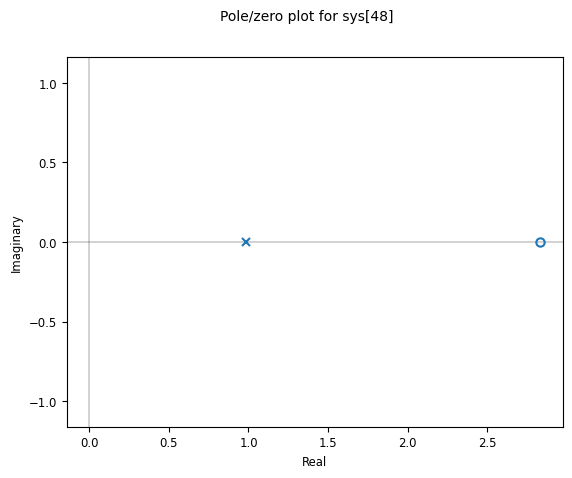

In [149]:
model_generator(athlete_list[1],1,2,0)

# 1º Practical assignment

In [52]:
uploaded = files.upload()

Saving MOB_Dataset1_A1_M1.csv to MOB_Dataset1_A1_M1 (1).csv
Saving MOB_Dataset1_A1_M2.csv to MOB_Dataset1_A1_M2 (1).csv
Saving MOB_Dataset1_A2_M3.csv to MOB_Dataset1_A2_M3 (1).csv
Saving MOB_Dataset1_A2_M4.csv to MOB_Dataset1_A2_M4 (1).csv
Saving MOB_Dataset1_A3_M5.csv to MOB_Dataset1_A3_M5 (1).csv
Saving MOB_Dataset1_A3_M6.csv to MOB_Dataset1_A3_M6 (1).csv
Saving MOB_Dataset1_A4_M7.csv to MOB_Dataset1_A4_M7 (1).csv
Saving MOB_Dataset1_A4_M8.csv to MOB_Dataset1_A4_M8 (1).csv
Saving MOB_Dataset1_A5_M9.csv to MOB_Dataset1_A5_M9 (1).csv
Saving MOB_Dataset1_A5_M10.csv to MOB_Dataset1_A5_M10 (1).csv
Saving MOB_Dataset1_A6_M11.csv to MOB_Dataset1_A6_M11 (1).csv
Saving MOB_Dataset1_A6_M12.csv to MOB_Dataset1_A6_M12 (1).csv


In [111]:
A1M1_df = pd.read_csv('MOB_Dataset1_A1_M1.csv', names=['y','u'])
A1M2_df = pd.read_csv('MOB_Dataset1_A1_M2.csv', names=['y','u'])
A2M1_df = pd.read_csv('MOB_Dataset1_A2_M3.csv', names=['y','u'])
A2M2_df = pd.read_csv('MOB_Dataset1_A2_M4.csv', names=['y','u'])
A3M1_df = pd.read_csv('MOB_Dataset1_A3_M5.csv', names=['y','u'])
A3M2_df = pd.read_csv('MOB_Dataset1_A3_M6.csv', names=['y','u'])
A4M1_df = pd.read_csv('MOB_Dataset1_A4_M7.csv', names=['y','u'])
A4M2_df = pd.read_csv('MOB_Dataset1_A4_M8.csv', names=['y','u'])
A5M1_df = pd.read_csv('MOB_Dataset1_A5_M9.csv', names=['y','u'])
A5M2_df = pd.read_csv('MOB_Dataset1_A5_M10.csv', names=['y','u'])
A6M1_df = pd.read_csv('MOB_Dataset1_A6_M11.csv', names=['y','u'])
A6M2_df = pd.read_csv('MOB_Dataset1_A6_M12.csv', names=['y','u'])

athlete_list = [A1M1_df, A1M2_df, A2M1_df, A2M2_df, A3M1_df, A3M2_df, A4M1_df, A4M2_df, A5M1_df, A5M2_df, A6M1_df, A6M2_df]
code_name = ['A1M1', 'A1M2', 'A2M1', 'A2M2', 'A3M1', 'A3M2', 'A4M1', 'A4M2', 'A5M1', 'A5M2', 'A6M1', 'A6M2']

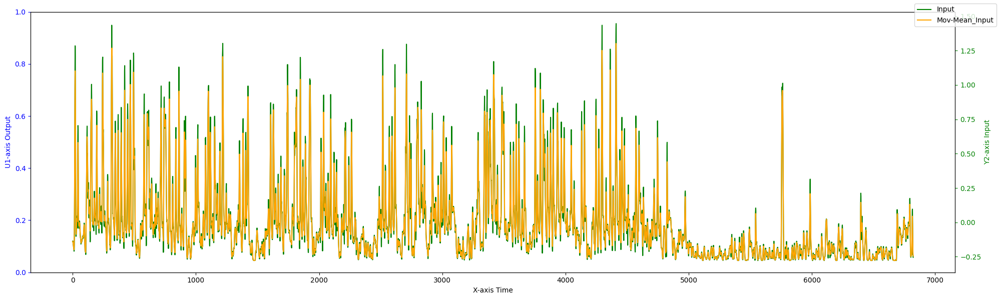

In [139]:
#1ºData Preparation
#Pre-processing

#High frequency disturbances (too high measurement frequency -> Downsampling)
#1ºlow pass filter | 2º Downsampling


#Outliers
dataset = athlete_list[8]

dataset['u'] = dataset['u'] - np.mean(dataset['u'])
dataset['y'] = dataset['y'] - np.mean(dataset['y'])

mov_avrg_u = dataset['u'].rolling(window=5, center=True, min_periods=1).mean()
mov_avrg_y = dataset['y'].rolling(window=2, center=True, min_periods=1).mean()
#result = mk.original_test(data)
trend = mk.original_test(athlete['y'])
#plot
fig, ax1 = plt.subplots(figsize=(20, 6))

#ax1.plot(dataset['y'], color='blue', label='Real_Output')
#ax1.plot(mov_avrg_y, color='red', label='Mov-Mean-output')
ax1.set_xlabel('X-axis Time')
ax1.set_ylabel('U1-axis Output', color='blue')
ax1.tick_params('y', colors='blue')

ax2 = ax1.twinx()
ax2.plot(dataset['u'], color='green', label='Input')
ax2.plot(mov_avrg_u, color='orange', label='Mov-Mean_Input')

ax2.set_ylabel('Y2-axis Input', color='green')
ax2.tick_params('y', colors='green')

fig.legend(loc="upper right")
fig.tight_layout()


In [131]:
print(trend)

Mann_Kendall_Test(trend='decreasing', h=True, p=0.0, z=-12.25900452768962, Tau=-0.1167138534728118, s=-1404297.0, var_s=13122207675.0, slope=-0.0016750418760469012, intercept=45.608040201005025)


Athlete:(7743, 2)
athlete['u'] Max: 1.3940000000000001 Min: 0.004000000000000092
athlete['y'] Max: 97.5 Min: 0.5
Athlete:(4460, 2)
athlete['u'] Max: 1.348 Min: 0.0
athlete['y'] Max: 78.0 Min: 0.0
Athlete:(7743, 2)
athlete['u'] Max: 1.432 Min: 0.005999999999999911
athlete['y'] Max: 90.0 Min: 0.5
Athlete:(4460, 2)
athlete['u'] Max: 1.388 Min: 0.0019999999999998222
athlete['y'] Max: 100.5 Min: 0.5
Athlete:(5895, 2)
athlete['u'] Max: 1.3080000000000003 Min: 0.0
athlete['y'] Max: 75.0 Min: 0.0
Athlete:(4626, 2)
athlete['u'] Max: 1.2119999999999997 Min: 0.0
athlete['y'] Max: 85.5 Min: 0.5
Athlete:(6823, 2)
athlete['u'] Max: 1.3119999999999998 Min: 0.004000000000000178
athlete['y'] Max: 101.5 Min: 1.0
Athlete:(4906, 2)
athlete['u'] Max: 1.3920000000000001 Min: 0.0
athlete['y'] Max: 105.5 Min: 0.5
Athlete:(6823, 2)
athlete['u'] Max: 1.7239999999999998 Min: 0.0
athlete['y'] Max: 114.0 Min: 0.5
Athlete:(4906, 2)
athlete['u'] Max: 1.5780000000000007 Min: 0.00400000000000071
athlete['y'] Max: 84.5

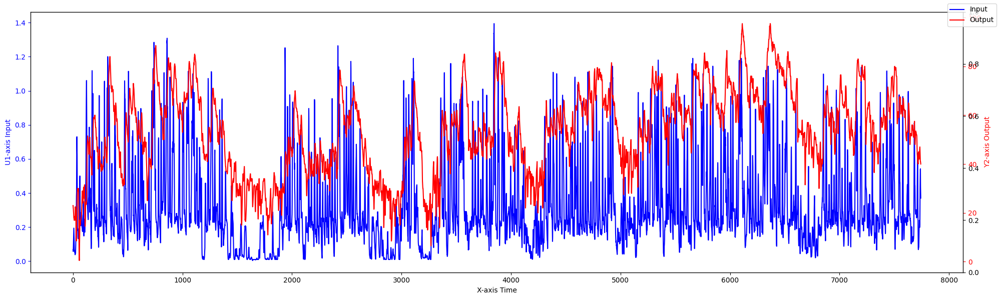

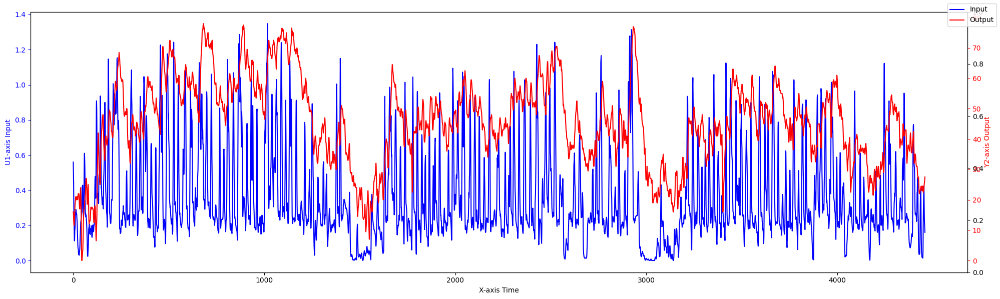

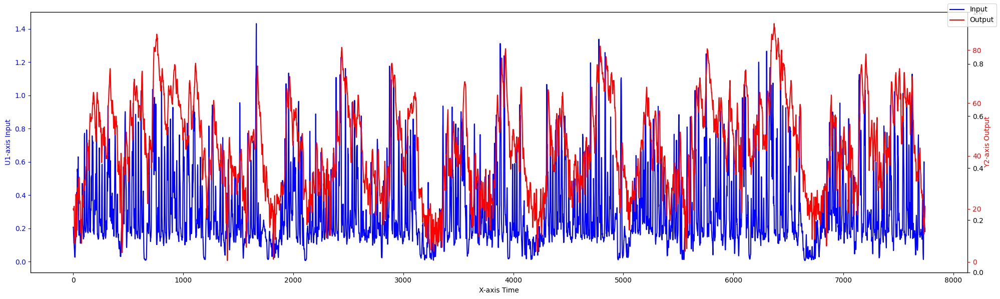

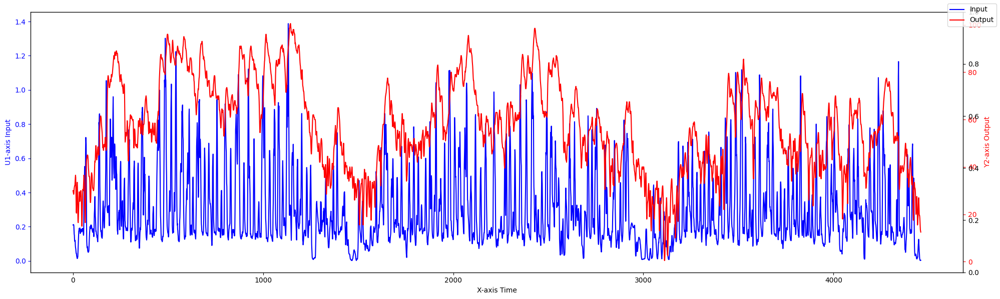

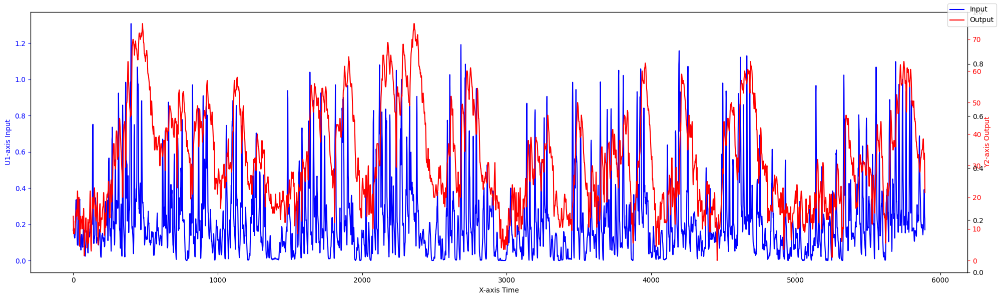

...

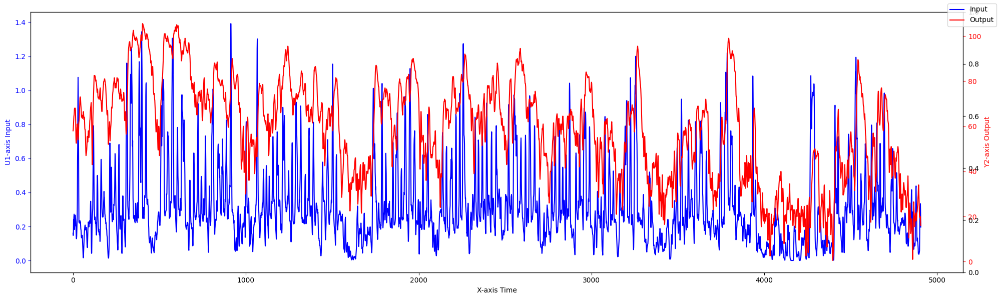

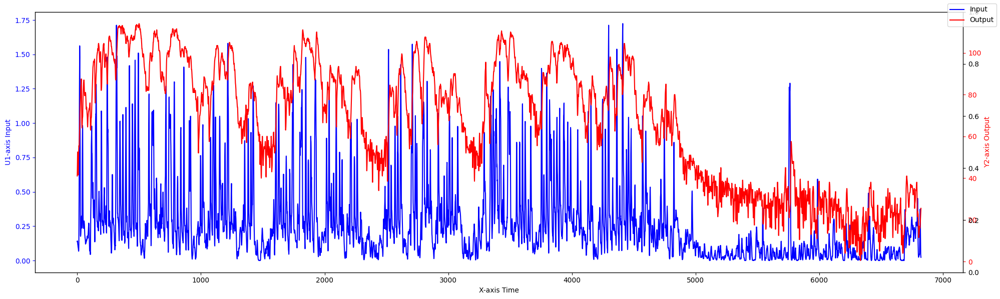

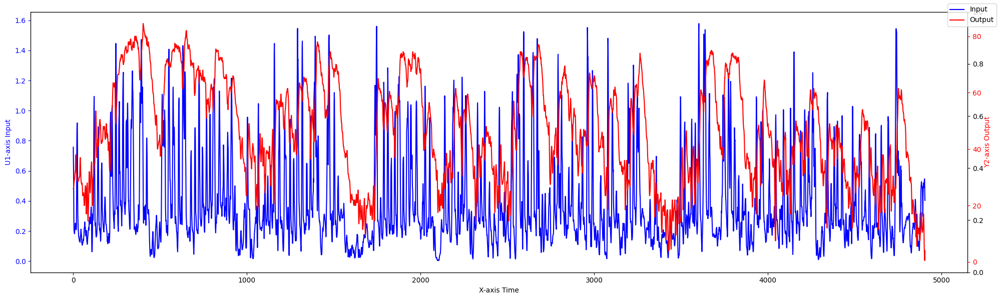

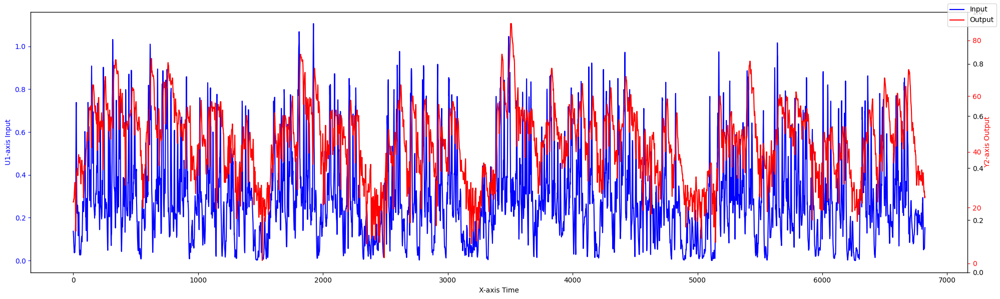

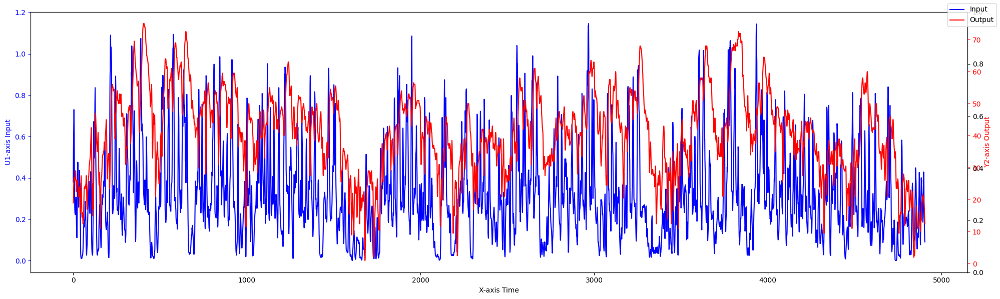

In [137]:
#1ºData Preparation
#Pre-processing && Ploting
limit = 0
for athlete in athlete_list:
  #Start all values at Zero
  print(f"Athlete:{athlete.shape}")
  #athlete['u'] = athlete['u'] - athlete['u'][0]
  #athlete['y'] = athlete['y'] - athlete['y'][0]

  athlete['u'] = athlete['u'] - athlete['u'].min()
  athlete['y'] = athlete['y'] - athlete['y'].min()

  athlete['u'] = athlete['u'].rolling(window=5, center=True, min_periods=1).mean()
  athlete['y'] = athlete['y'].rolling(window=2, center=True, min_periods=1).mean()


  #Ploting using two axis with different scales
  fig, ax1 = plt.subplots(figsize=(20, 6))
  ax1.plot(athlete['u'], color='blue', label='Input')
  ax1.set_xlabel('X-axis Time')
  ax1.set_ylabel('U1-axis Input', color='blue')
  ax1.tick_params('y', colors='blue')
  ax2 = ax1.twinx()
  print("athlete['u']",'Max:',athlete['u'].max(),'Min:',athlete['u'].min())
  print("athlete['y']",'Max:',athlete['y'].max(),'Min:',athlete['y'].min())

  #trend = mk.original_test(athlete['y'])
  ax3 = ax1.twinx()
  #ax3.plot(trend, color='green', label='Output')

  '''  if athlete.shape[0] == 7743 and limit == 0:
    print("tEAWDAWDrue")
    athlete_list[0]['u'] = athlete['u']
    athlete_list[0]['y'] = athlete['y']
    limit +=+ 1'''
  #y_mean = np.mean(athlete['y'])
  #print("Mean of y:", y_mean)
  #print("Variance of y:", np.var(y))
  ax2.plot(athlete['y'], color='red', label='Output')
  ax2.set_ylabel('Y2-axis Output', color='red')
  ax2.tick_params('y', colors='red')
  fig.legend(loc="upper right")
  fig.tight_layout()


In [ ]:
#Smoothing the Data
#capture important patterns in the data, while leaving out noise or other fine-scale structures/rapid phenomena.

## 2º System Identification

Athlete: A1M1

Model #0 Dataset:A1M1 
with 0 a parameters, 1 b parameters and 0 time delay
its regression yield r squared: -2.646507869999437, Akaike's information criteria: 10018.367043276936

Model #1 Dataset:A1M1 
with 0 a parameters, 1 b parameters and 1 time delay
its regression yield r squared: -2.561947730634258, Akaike's information criteria: 9835.450439536078

Model #2 Dataset:A1M1 
with 0 a parameters, 1 b parameters and 2 time delay


<ipython-input-138-6cfcb3e1facd>:85: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results_df = pd.concat([results_df, new_row], ignore_index=True)


its regression yield r squared: -2.47600058607992, Akaike's information criteria: 9645.129590322844

Model #3 Dataset:A1M1 
with 0 a parameters, 1 b parameters and 3 time delay
its regression yield r squared: -2.3949497551947956, Akaike's information criteria: 9461.294271137522

Model #4 Dataset:A1M1 
with 0 a parameters, 1 b parameters and 4 time delay
its regression yield r squared: -2.3246057838997705, Akaike's information criteria: 9298.054857034236

Model #5 Dataset:A1M1 
with 0 a parameters, 2 b parameters and 0 time delay
its regression yield r squared: -2.3612715897071137, Akaike's information criteria: 9388.56410150061

Model #6 Dataset:A1M1 
with 0 a parameters, 2 b parameters and 1 time delay
its regression yield r squared: -2.2772211105163485, Akaike's information criteria: 9191.34780854094

Model #7 Dataset:A1M1 
with 0 a parameters, 2 b parameters and 2 time delay
its regression yield r squared: -2.1981565993747445, Akaike's information criteria: 9001.164683306444

Model 

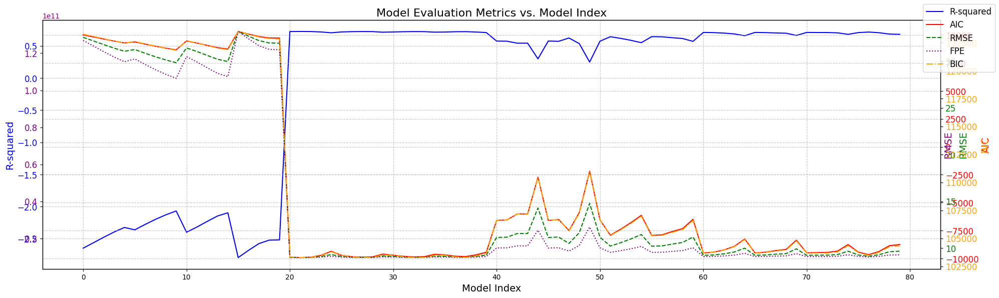

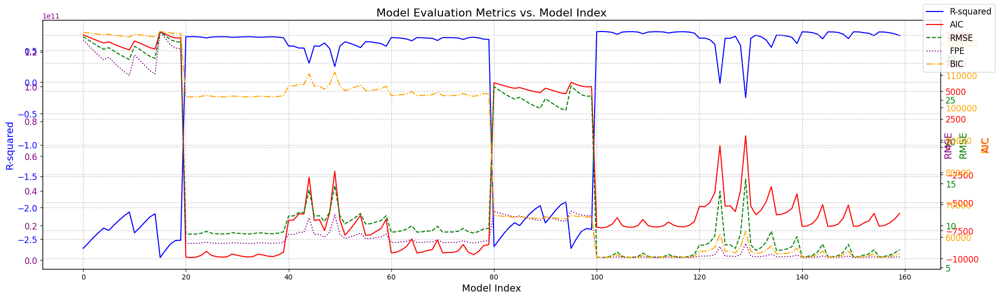

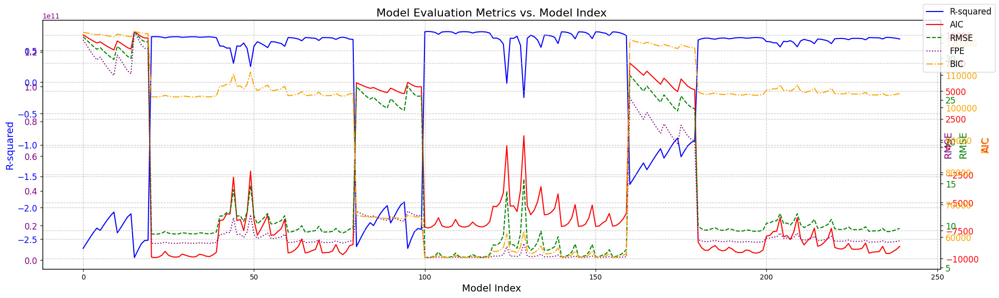

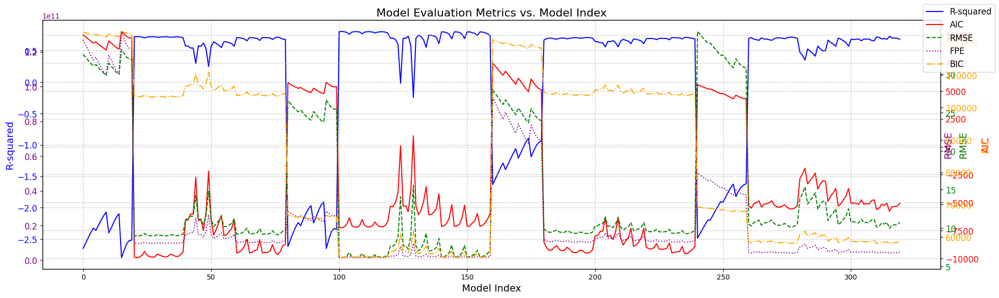

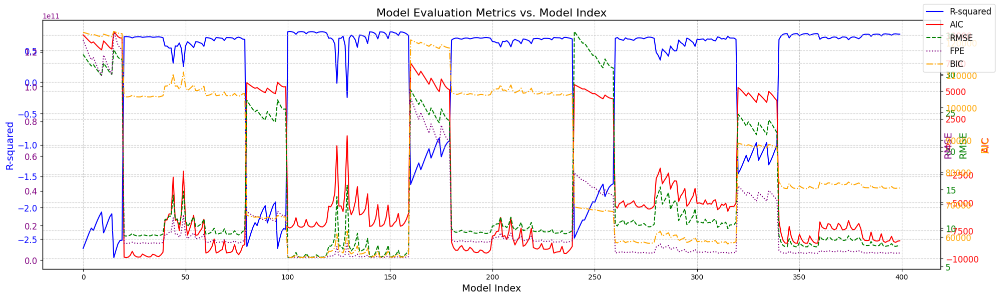

...

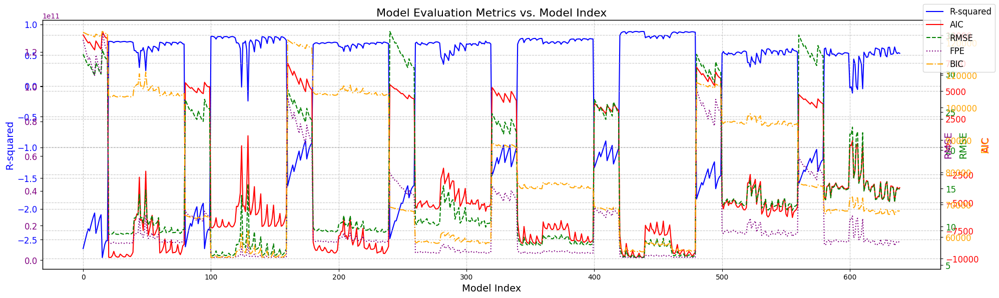

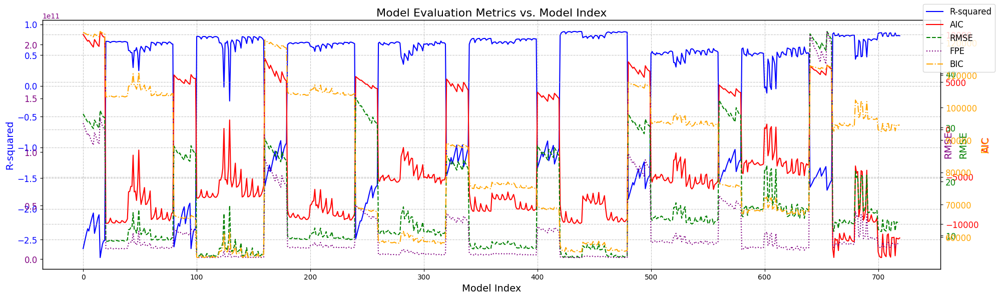

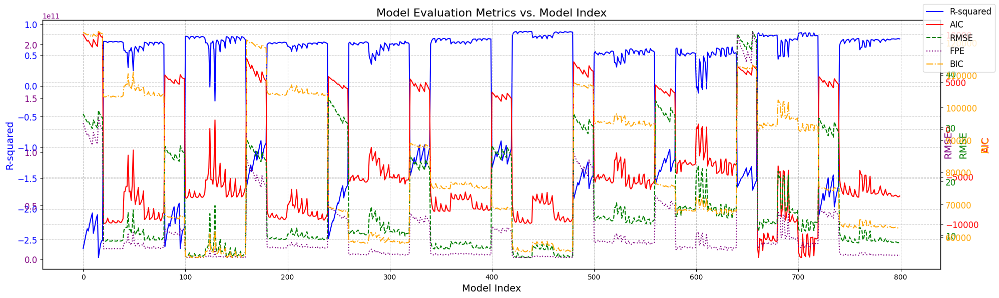

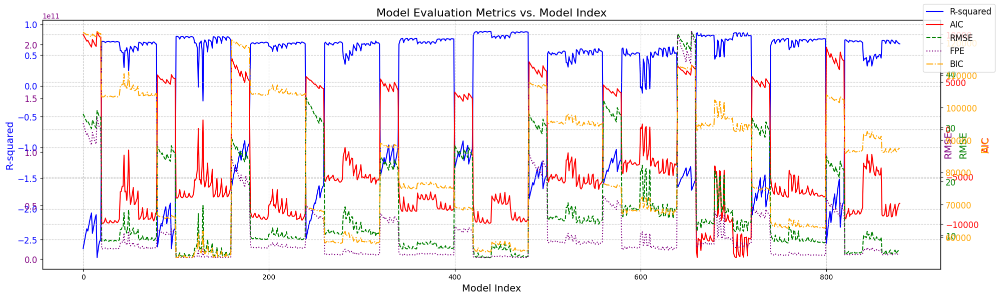

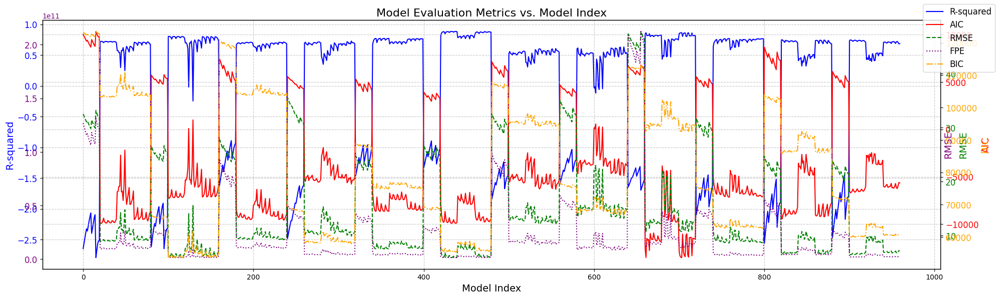

In [138]:
from re import X
# Find the best model structure (time-invariant modelling)
results_df = pd.DataFrame(columns=['Athlete_Code','Model_Index', 'na', 'nb', 'd', 'AIC', 'Rsq','RMSE','BIC','FPE'])
selected_models = pd.DataFrame(columns=['Athlete_Code','ParamCount','ParamValues','Metrics'])  #ParamCount[na:nb:d] || ParamValues[na,nb] || Metrics[Rsq, AIC, FPE]

# Calculate ARX models to the evaluation data with all possible parameters to find the best fit by checking r-squared and AIC
# Define a max for a, b, and delay (d)
na_max = nb_max = xdelay_max = 4
model_count=0

##Loop through parameters
#Starts 1:1:0 .... 3,3,3               (1,na_max|1,nb_max|xdelay_max) (max=4)
#Starts 1:1:0 .... 4,4,4               (1,na_max+1|1,nb_max+1|xdelay_max+1)(max=4)
#Starts 0:1:0 .... 3,4,4               (na_max|1,nb_max+1|xdelay_max+1)(max=4)

for i in range(len(athlete_list)):
  data = athlete_list[i]
  model_count=0
  print(f"Athlete: {code_name[i]}")
  for na in range(na_max):
    for nb in range(1,nb_max+1):
      for d in range(xdelay_max+1):
        print('\nModel #{} Dataset:{} \nwith {} a parameters, {} b parameters and {} time delay'.format(model_count,code_name[i],na,nb,d))
        #load the associated data using dataloader(data, na, nb, d)
        X_loader, y_loader = dataloader(data, na,  nb, d)
        #print("X_loader:",X_loader)#print("y_loader:",y_loader)


        #Correction to use python## Only when values are equal to zero
        if X_loader.empty:#
            print("Skipping model due to empty X_loader.")
            continue # proceed to next iteration
        if y_loader.empty:
            print("Skipping model due to empty y_loader.")
            continue # proceed to next iteration


        ##Calculate the a and b parameters
        # parameters vector [a0...an, b0...bm].T by the formula inv(X.T dot X) dot X.T dot y
        parameters = np.linalg.inv(X_loader.T.dot(X_loader)).dot(X_loader.T).dot(y_loader)
        parameters_a = parameters[:na]
        parameters_b = parameters[na:]


        ## Simulate values of Y
        ysim = np.zeros(len(y_loader)) # the plus one is because the first value is initialized and not simulated
        ysim[0]= y_loader.values[0] # initialize the first value
        max_lag= max(na,nb+d-1)  # Maximum lag across both endogenous and exogenous variables

        for k in range(max_lag, len(X_loader)):
        # Add the contribution from autoregressive terms (endogenous variables)
          for i_a in range(1,na+1):
              #print("parameter a: ",i_a)
              ysim[k] += parameters_a[i_a-1] * ysim[k - i_a]  # Note: parameters_a starts at index 0

        # Add the contribution from exogenous input terms (with delay d)
          for j_b in range(nb):
              #print("parameter b: ",j_b)
              ysim[k] += parameters_b[j_b] * X_loader['u-{}'.format(d+j_b)].iloc[k-j_b]  # Note: parameters_b starts at index 0
              #print('u-{}'.format(d+j_b),j_b,d)



        ## Model evaluation for each generated model use r_squared and aic def above
        # Calculate r-squared and AIC and RMSE and BIC and FPE
        # model_metrics(y_loader,ysim)
        n = len(y_loader)
        SSR = np.sum((y_loader - ysim) ** 2)
        #Calculate usefull Model evaluation parameters
        r_squared = r_2(y_loader, ysim)
        aic =  2 * (na + nb) + len(y_loader) * np.log(1 - r_squared) # Evaluates the complexicity of the Model
        Rmse = rmse(y_loader, ysim[0:])  #Root Mean Squared Error (Less sensitive to outliers: It is less affected by extreme errors compared to RMSE)
        fpe = SSR * (n + k) / (n - k)                  #Final Prediction Error(used for model order selection)(Considers both model fit and complexity) (Asymptotically equivalent to AIC: For large sample sizes, FPE and AIC tend to select the same model)
        bic = n * np.log(SSR / n) + k * np.log(n)      #Bayesian Information Criterion (BIC penalizes model complexity more heavily than AIC.)(Consistent: more likely to select the true model when sample is bigger)


        print("its regression yield r squared: {}, Akaike's information criteria: {}".format(r_squared, aic))



        # Save relevant information to the empty lists
        new_row = pd.DataFrame({'Athlete_Code': code_name[i],'Model_Index': [model_count], 'na': [na], 'nb': [nb], 'd': [d], 'AIC': [aic], 'Rsq': [r_squared],'RMSE':[Rmse], 'BIC':[bic],'FPE':[fpe], 'Parameters_a':[parameters_a], 'Parameters_b':[parameters_b]})
        results_df = pd.concat([results_df, new_row], ignore_index=True)

        # Update the model counter
        model_count += 1



  #Plot for each player/game
  fig, ax1 = plt.subplots(figsize=(20, 6))
  X_axis = np.arange(len(results_df)) #results_df['Model_Index']

  #For R-square Error
  ax1.plot(X_axis, results_df['Rsq'], color='blue', label='R-squared')
  ax1.set_xlabel('Model Index', fontsize=14)  # Increased font size
  ax1.set_ylabel('R-squared', color='blue', fontsize=14)  # Increased font size
  ax1.tick_params(axis='y', labelcolor='blue', labelsize=12)  # Increased tick label size

  #For AIC
  ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
  ax2.plot(X_axis, results_df['AIC'], color='red', label='AIC')
  ax2.set_ylabel('AIC', color='red', fontsize=14)  # Increased font size
  ax2.tick_params(axis='y', labelcolor='red', labelsize=12)  # Increased tick label size

  #For RMSE
  ax3 = ax1.twinx()
  ax3.plot(X_axis, results_df['RMSE'], color='green', label='RMSE', linestyle='--')
  ax3.set_ylabel('RMSE', color='green', fontsize=14)
  ax3.tick_params(axis='y', labelcolor='green', labelsize=12)

  #For FPE
  ax4 = ax1.twinx()
  ax4.plot(X_axis, results_df['FPE'], color='purple', label='FPE', linestyle=':')
  ax4.set_ylabel('RMSE', color='purple', fontsize=14)
  ax4.tick_params(axis='y', labelcolor='purple', labelsize=12)

  #For BIC
  ax5 = ax4.twinx()
  ax5.plot(X_axis, results_df['BIC'], color='orange', label='BIC', linestyle='-.')
  ax5.set_ylabel('BIC', color='orange', fontsize=14)
  ax5.tick_params(axis='y', labelcolor='orange', labelsize=12)

  # General graphic configs
  fig.legend(loc="upper right", fontsize=12)  # Add a legend for both plots, increased font size
  ax1.grid(True, linestyle='--', alpha=0.7)  # Added grid with dashed lines and transparency
  ax2.grid(True, linestyle='--', alpha=0.7)  # Added grid with dashed lines and transparency
  plt.title('Model Evaluation Metrics vs. Model Index', fontsize=16)  # Added title with increased font size
  plt.tight_layout()  # Adjust layout to prevent overlapping elements
plt.show()

In [151]:
results_df

,Athlete_Code,Model_Index,na,nb,d,AIC,Rsq,RMSE,BIC,FPE,Parameters_a,Parameters_b
0,A1M1,0,0,1,0,10018.367043,-2.646508,32.538160,123237.820750,1.269095e+11,[],[108.3978313846115]
1,A1M1,1,0,1,1,9835.450440,-2.561948,32.153837,123036.947954,1.238973e+11,[],[109.04348028704645]
2,A1M1,2,0,1,2,9645.129590,-2.476001,31.758536,122828.561427,1.208384e+11,[],[109.6973613398184]
3,A1M1,3,0,1,3,9461.294271,-2.394950,31.380915,122626.549074,1.179513e+11,[],[110.3127247440222]
4,A1M1,4,0,1,4,9298.054857,-2.324606,31.048527,122444.906065,1.154360e+11,[],[110.85129249317163]
...,...,...,...,...,...,...,...,...,...,...,...,...
955,A6M2,75,3,4,0,-6084.636549,0.711803,6.900740,60583.437288,2.288356e+09,"[2.196355362486569, -1.7895616472482654, 0.584...","[0.8711822507742575, -0.207354745507494, -0.79..."
956,A6M2,76,3,4,1,-6253.779846,0.721650,6.781659,60399.455074,2.209159e+09,"[2.1933011935122946, -1.785554085479578, 0.583...","[1.2161962020509893, -0.8610036760065074, -0.0..."
957,A6M2,77,3,4,2,-5980.964611,0.705790,6.972085,60657.516038,2.334012e+09,"[2.1914459496438137, -1.7862987493540838, 0.58...","[1.0877828060209733, 0.5985560311400908, -2.60..."
958,A6M2,78,3,4,3,-5607.180113,0.682543,7.242186,61016.545993,2.517328e+09,"[2.1862659230030017, -1.780432164054476, 0.583...","[2.3497462940958895, -1.8195026383336055, -1.4..."


In [140]:
#Select Best Models
scaler = MinMaxScaler()
normalized_metrics = scaler.fit_transform(results_df[['AIC', 'Rsq', 'FPE', 'BIC', 'RMSE']])
# Create a new DataFrame with the normalized metrics
normalized_df = pd.DataFrame(normalized_metrics, columns=['AIC_norm', 'Rsq_norm', 'FPE_norm', 'BIC_norm', 'RMSE_norm'])
selection_df = pd.concat([results_df, normalized_df], axis=1)


#best_models_df = pd.DataFrame(columns=['Athlete_Code','ParamCount','ParamValues','Metrics'])  #ParamCount[na:nb:d] || ParamValues[na,nb] || Metrics[Rsq, AIC, FPE]
best_models_df = pd.DataFrame()


num_models = na_max*nb_max*(xdelay_max+1)
cases = len(results_df)/(num_models) #12

#LOOP for each case (models)
for i in range(int(cases)):
  print("Case: ",i,"Start: ",(i*num_models),"End: ",(i+1)*num_models)
  #Select each dataset models data
  selected_df = selection_df[(i*num_models):(i+1)*num_models].copy()

  #Create a Ranking Selection
  selected_df['AIC_rank'] = selected_df['AIC'].rank()
  selected_df['BIC_rank'] = selected_df['BIC'].rank()

  # Rank by Rsq
  selected_df['Rsq_rank'] = selected_df['Rsq'].rank(ascending=False)  # Note: ascending=False for Rsq

  # Calculate the combined ranking
  selected_df['Ranking'] = selected_df['Rsq_rank'] + selected_df['AIC_rank']+ selected_df['BIC_rank']

  best_df = selected_df.sort_values(by='Ranking', ascending=True).iloc[0]
  #new_row = pd.DataFrame({'Athlete_Code':[filter['Athlete_Code'][0]],'ParamCount'["{}:{}:{}".format(filter['na'][0],filter['nb'][0],filter['d'][0])],'ParamValues':[],'Metrics':[filter['Rsq'][0],filter['AIC'][0],filter['FPE'][0]]})

  #print(best_df)
  #print(selected_df.sort_values(by='Ranking', ascending=True))



  new_row = pd.DataFrame({'Athlete_Code': [best_df['Athlete_Code']],
                          'na': [best_df['na']],
                          'nb': [best_df['nb']],
                          'd': [best_df['d']],
                          'Ranking': [best_df['Ranking']],
                          'AIC_rank': [best_df['AIC_rank']],
                          'Rsq_rank': [best_df['Rsq_rank']],
                          'BIC_rank': [best_df['BIC_rank']],
                          'Rsq': [best_df['Rsq']],
                          'AIC': [best_df['AIC']],
                          'BIC': [best_df['BIC']],
                          'FPE': [best_df['FPE']],
                          'Parameters_a':[parameters_a],
                          'Parameters_b':[parameters_b]})

  best_models_df = pd.concat([best_models_df, new_row], ignore_index=True)

  #print(selected_df.sort_values(by='Rsq', ascending=False)[:3])
  #print(selected_df.sort_values(by='AIC', ascending=True)[:3])
  #print(selected_df.sort_values(by='FPE', ascending=True)[:3])


Case:  0 Start:  0 End:  80
Case:  1 Start:  80 End:  160
Case:  2 Start:  160 End:  240
Case:  3 Start:  240 End:  320
Case:  4 Start:  320 End:  400
Case:  5 Start:  400 End:  480
Case:  6 Start:  480 End:  560
Case:  7 Start:  560 End:  640
Case:  8 Start:  640 End:  720
Case:  9 Start:  720 End:  800
Case:  10 Start:  800 End:  880
Case:  11 Start:  880 End:  960


In [152]:
best_models_df

,Athlete_Code,na,nb,d,Ranking,AIC_rank,Rsq_rank,BIC_rank,Rsq,AIC,BIC,FPE,Parameters_a,Parameters_b
0,A1M1,1,1,1,4.0,1.0,1.0,2.0,0.722288,-9913.530782,103285.966732,9.659829e+09,"[2.1964651223805656, -1.7982833911242504, 0.59...","[2.0605487782682457, -2.967036503315056, 1.795..."
1,A1M2,1,1,1,3.0,1.0,1.0,1.0,0.804200,-7265.478476,53691.139848,1.518742e+09,"[2.1964651223805656, -1.7982833911242504, 0.59...","[2.0605487782682457, -2.967036503315056, 1.795..."
2,A2M1,3,4,1,3.0,1.0,1.0,1.0,0.709525,-9552.010572,103756.332089,1.031447e+10,"[2.1964651223805656, -1.7982833911242504, 0.59...","[2.0605487782682457, -2.967036503315056, 1.795..."
3,A2M2,3,4,0,3.0,1.0,1.0,1.0,0.726973,-5770.705147,57898.357389,3.923598e+09,"[2.1964651223805656, -1.7982833911242504, 0.59...","[2.0605487782682457, -2.967036503315056, 1.795..."
4,A3M1,1,3,3,7.0,2.0,1.0,4.0,0.769706,-8639.407848,74968.887111,3.984602e+09,"[2.1964651223805656, -1.7982833911242504, 0.59...","[2.0605487782682457, -2.967036503315056, 1.795..."
5,A3M2,1,3,3,4.0,1.0,1.0,2.0,0.883155,-9910.707407,55473.513371,1.517408e+09,"[2.1964651223805656, -1.7982833911242504, 0.59...","[2.0605487782682457, -2.967036503315056, 1.795..."
6,A4M1,3,4,0,3.0,1.0,1.0,1.0,0.605469,-6328.062712,94217.503462,1.367378e+10,"[2.1964651223805656, -1.7982833911242504, 0.59...","[2.0605487782682457, -2.967036503315056, 1.795..."
7,A4M2,3,4,0,3.0,1.0,1.0,1.0,0.631495,-4879.669261,66952.959423,8.391387e+09,"[2.1964651223805656, -1.7982833911242504, 0.59...","[2.0605487782682457, -2.967036503315056, 1.795..."
8,A5M1,3,1,3,3.0,1.0,1.0,1.0,0.862438,-13518.725705,92627.345081,1.082962e+10,"[2.1964651223805656, -1.7982833911242504, 0.59...","[2.0605487782682457, -2.967036503315056, 1.795..."
9,A5M2,1,4,3,4.0,1.0,1.0,2.0,0.767969,-7146.870774,62796.407242,3.620128e+09,"[2.1964651223805656, -1.7982833911242504, 0.59...","[2.0605487782682457, -2.967036503315056, 1.795..."


In [143]:
results_df.sort_values(by='Rsq', ascending=False)
#Rsq: 1,5,0,16,11,6,15,10,61
#AIC: 1,5,0,6,11,16,15,10,61
#FPE: 0,5,1,60,72,71,62,75,76

,Athlete_Code,Model_Index,na,nb,d,AIC,Rsq,RMSE,BIC,FPE,Parameters_a,Parameters_b
433,A3M2,33,1,3,3,-9910.707407,0.883155,5.962353,55473.513371,1.517408e+09,[0.9814369680556814],"[2.932728065301651, -2.001857153835328, 1.9265..."
438,A3M2,38,1,4,3,-9901.566060,0.883029,5.965100,55464.758946,1.518149e+09,[0.9812392004312193],"[2.8639899515086413, -1.6277990114795693, 1.30..."
437,A3M2,37,1,4,2,-9896.558087,0.882847,5.970198,55485.662691,1.521403e+09,[0.9807220125123799],"[1.6566828504294762, -0.08374367146297601, -0...."
432,A3M2,32,1,3,2,-9896.053258,0.882729,5.973680,55504.062635,1.523838e+09,[0.9815957472667369],"[1.970561973402509, -1.7815802940105494, 2.656..."
428,A3M2,28,1,2,3,-9831.545309,0.881029,6.016823,55570.570584,1.545929e+09,[0.9827136340774631],"[1.5078325739352036, 1.1531925924292383]"
...,...,...,...,...,...,...,...,...,...,...,...,...
80,A1M2,0,0,1,0,5734.788243,-2.617079,26.580349,66711.722150,2.809167e+10,[],[89.04864822739364]
0,A1M1,0,0,1,0,10018.367043,-2.646508,32.538160,123237.820750,1.269095e+11,[],[108.3978313846115]
95,A1M2,15,0,4,0,5773.944368,-2.647249,26.653921,66688.468129,2.820940e+10,[],"[118.83185264517081, -71.70992504561283, -92.5..."
16,A1M1,16,0,4,1,10090.407399,-2.680223,32.666905,123231.258607,1.277837e+11,[],"[149.72151907174444, -89.92180942861087, -117...."


Den(a):  [0.98236793]
Num(b):  [-1.32669427  3.86011359]
[20. 20.  0. ...  0.  0.  0.]
[   0    1    2 ... 7740 7741 7742]


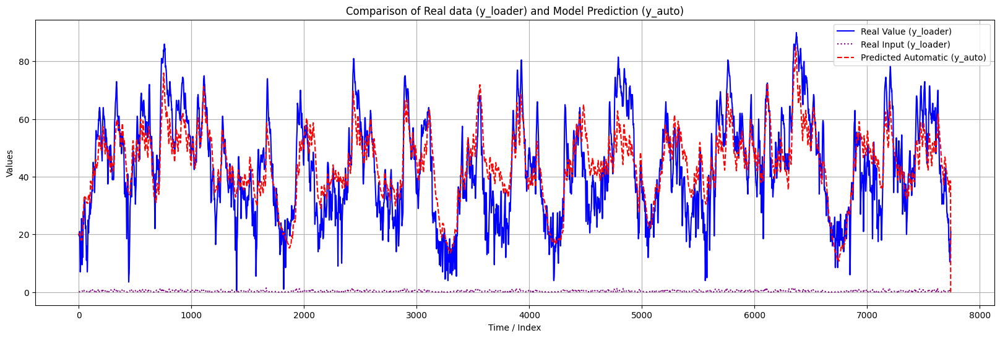

In [146]:
#Simulation best model structure
number_a=1
number_b=2
d=0

data = athlete_list[2]
# print the relative dataframe and check its columns
X_loader,y_loader = dataloader(data,number_a,number_b,d)
parameters = np.linalg.inv(X_loader.T.dot(X_loader)).dot(X_loader.T).dot(y_loader)
den = parameters[:number_a] #parameters a
num = parameters[number_a:] #parameters b

print("Den(a): ", den)
print("Num(b): ", num)
X_loader.head()

y = np.zeros(len(data))
y_auto = np.zeros(len(data))
y_auto[:max(number_a,number_b+d)] = data['y'][0]
print(y_auto)

#works for (0,1,0),(1,0,0)
for k in range(max(number_a,number_b +d), len(X_loader)):
  ##AUTOMATIC
  # Add the contribution from autoregressive terms (endogenous variables)
  for i_a in range(1, number_a + 1):
      y_auto[k] += den[i_a-1] * y_auto[k - i_a]  # Note: parameters_a starts at index 0
  # Add the contribution from exogenous input terms (with delay d)
  for j_b in range(number_b):
    #print("Input: ",'u-{}'.format(j_b+d))
    y_auto[k] += num[j_b] * X_loader['u-{}'.format(j_b+d)].iloc[k-j_b-d]



#Ploting
plt.figure(figsize=(20, 6))
X_axis = np.arange(0,data.shape[0])
print(X_axis)
# Plot the actual values (y_loader)
plt.plot(data['y'], label='Real Value (y_loader)', color='blue')
plt.plot(data['u'], label='Real Input (y_loader)', color='purple', linestyle=':')
# Plot the original data (y)    *AUTOMATIC
plt.plot(X_axis, y_auto, label='Predicted Automatic (y_auto)', color='red', linestyle='--')

# Add labels and title
plt.xlabel('Time / Index')
plt.ylabel('Values')
plt.title('Comparison of Real data (y_loader) and Model Prediction (y_auto)')
plt.legend()  # Add a legend
plt.grid(True) # Add grid lines for better readability
# Adjust the y-axis limits if necessary for better visualization
#plt.ylim([50, 200])
plt.show()

Athlete: A1M1

Model #0 
with 1 a parameters, 2 b parameters and 0 time delay
SSG: 159.13701283891152 SSG2: [159.13701284]
parameters a [0.98761612] Poles: 1.0125391632486838
parameters a2 [1, array([-0.98761612])] Poles2: [-1.01253916]
Time constant: -80.24909961034447


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


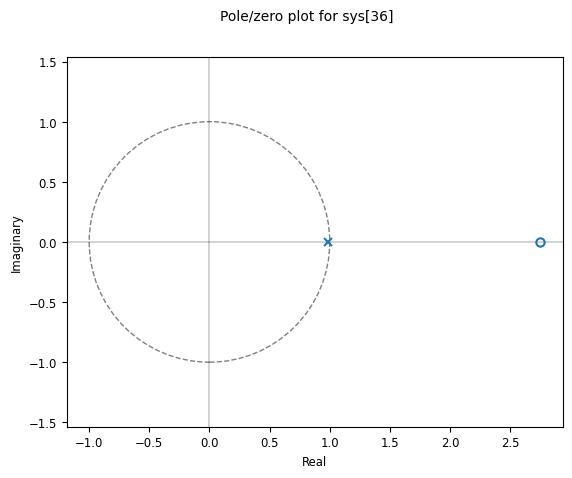

<ipython-input-145-cb1a34e558bd>:103: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  one_4_all = pd.concat([one_4_all, new_row], ignore_index=True)


its regression yield r squared: 0.7151370788107407, Akaike's information criteria: -9706.73901872124
Athlete: A1M2

Model #1 
with 1 a parameters, 2 b parameters and 0 time delay
SSG: 126.53139124795089 SSG2: [126.53139125]
parameters a [0.98422465] Poles: 1.0160282009906796
parameters a2 [1, array([-0.98422465])] Poles2: [-1.0160282]
Time constant: -62.888708616012316


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


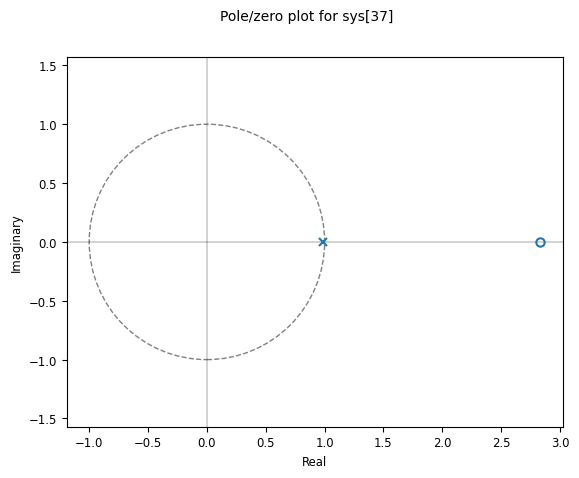

its regression yield r squared: 0.7955200529599864, Akaike's information criteria: -7062.118165155924
Athlete: A2M1

Model #2 
with 1 a parameters, 2 b parameters and 0 time delay
SSG: 143.68243249878384 SSG2: [143.6824325]
parameters a [0.98236793] Poles: 1.0179485443596281
parameters a2 [1, array([-0.98236793])] Poles2: [-1.01794854]
Time constant: -56.21334211443507


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


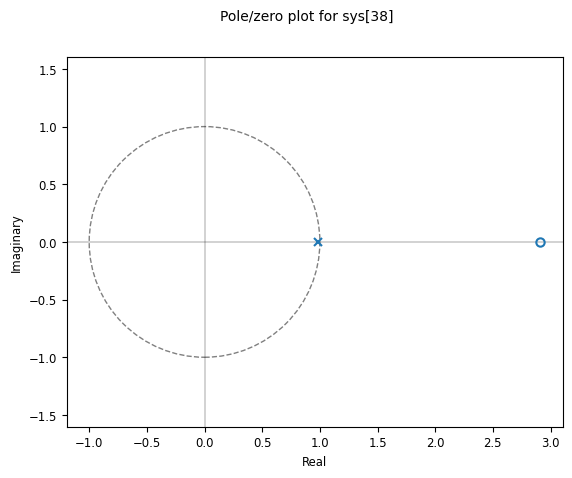

its regression yield r squared: 0.6811110453980813, Akaike's information criteria: -8833.284435520352
Athlete: A2M2

Model #3 
with 1 a parameters, 2 b parameters and 0 time delay
SSG: 189.67107617074424 SSG2: [189.67107617]
parameters a [0.98824242] Poles: 1.0118974646326937
parameters a2 [1, array([-0.98824242])] Poles2: [-1.01189746]
Time constant: -84.55053553111382


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


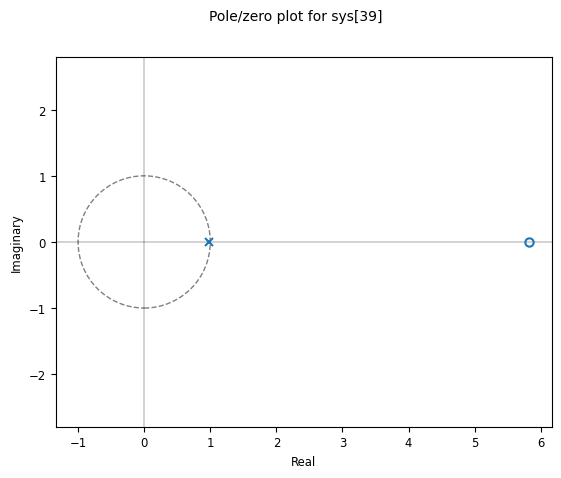

its regression yield r squared: 0.7026399147460015, Akaike's information criteria: -5392.713516721713
Athlete: A3M1

Model #4 
with 1 a parameters, 2 b parameters and 0 time delay
SSG: 144.43523646845887 SSG2: [144.43523647]
parameters a [0.98725471] Poles: 1.0129098339108056
parameters a2 [1, array([-0.98725471])] Poles2: [-1.01290983]
Time constant: -77.95926145771621


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


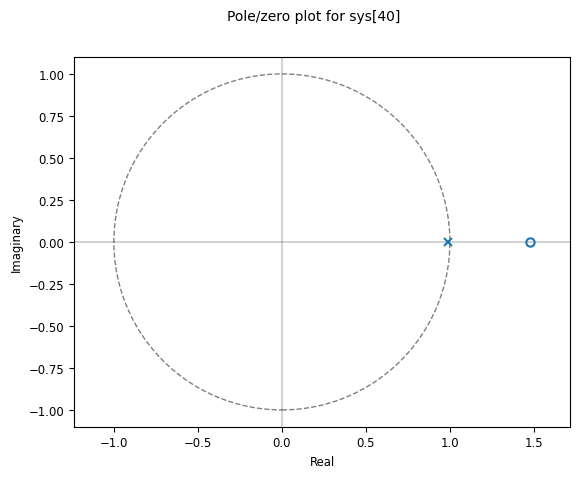

its regression yield r squared: 0.7022255172489347, Akaike's information criteria: -7124.891272813207
Athlete: A3M2

Model #5 
with 1 a parameters, 2 b parameters and 0 time delay
SSG: 154.2680929311929 SSG2: [154.26809293]
parameters a [0.98729757] Poles: 1.012865861126481
parameters a2 [1, array([-0.98729757])] Poles2: [-1.01286586]
Time constant: -78.2240080544517


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


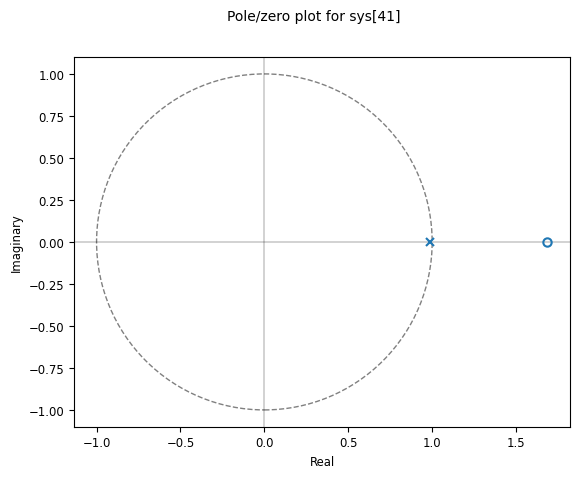

its regression yield r squared: 0.8462559688927636, Akaike's information criteria: -8644.283686215738
Athlete: A4M1

Model #6 
with 1 a parameters, 2 b parameters and 0 time delay
SSG: 168.73842224816616 SSG2: [168.73842225]
parameters a [0.98701338] Poles: 1.0131574932453309
parameters a2 [1, array([-0.98701338])] Poles2: [-1.01315749]
Time constant: -76.50122978172652


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


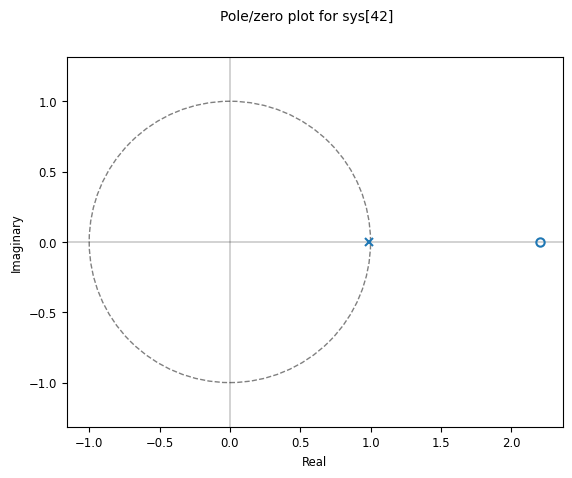

its regression yield r squared: 0.5374379556280356, Akaike's information criteria: -5244.8176172296835
Athlete: A4M2

Model #7 
with 1 a parameters, 2 b parameters and 0 time delay
SSG: 182.14649904001948 SSG2: [182.14649904]
parameters a [0.98740366] Poles: 1.0127570352030508
parameters a2 [1, array([-0.98740366])] Poles2: [-1.01275704]
Time constant: -78.88706314329636


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


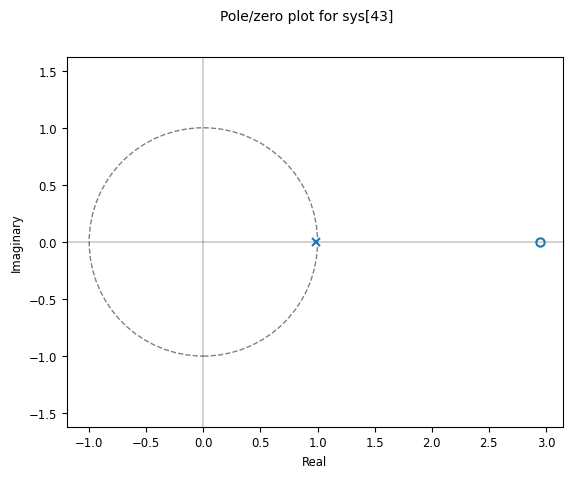

its regression yield r squared: 0.5993736617647822, Akaike's information criteria: -4471.816848069687
Athlete: A5M1

Model #8 
with 1 a parameters, 2 b parameters and 0 time delay
SSG: 168.99303067127437 SSG2: [168.99303067]
parameters a [0.99152955] Poles: 1.0085428115076525
parameters a2 [1, array([-0.99152955])] Poles2: [-1.00854281]
Time constant: -117.55677262174832


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


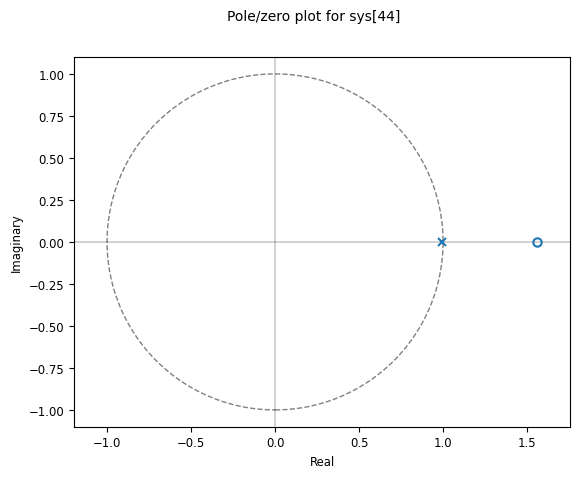

its regression yield r squared: 0.8698444457907404, Akaike's information criteria: -13894.189340876792
Athlete: A5M2

Model #9 
with 1 a parameters, 2 b parameters and 0 time delay
SSG: 124.51549674608722 SSG2: [124.51549675]
parameters a [0.98744774] Poles: 1.0127118263337456
parameters a2 [1, array([-0.98744774])] Poles2: [-1.01271183]
Time constant: -79.16584964058542


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


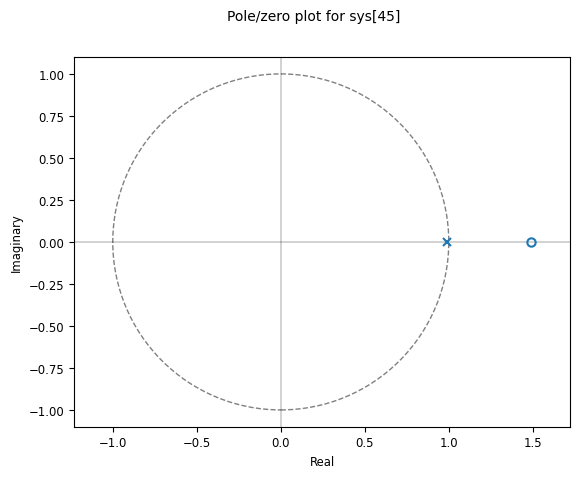

its regression yield r squared: 0.6847175090407909, Akaike's information criteria: -5646.61974715965
Athlete: A6M1

Model #10 
with 1 a parameters, 2 b parameters and 0 time delay
SSG: 142.50926657058713 SSG2: [142.50926657]
parameters a [0.97798373] Poles: 1.0225118939932036
parameters a2 [1, array([-0.97798373])] Poles2: [-1.02251189]
Time constant: -44.91910737848857


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


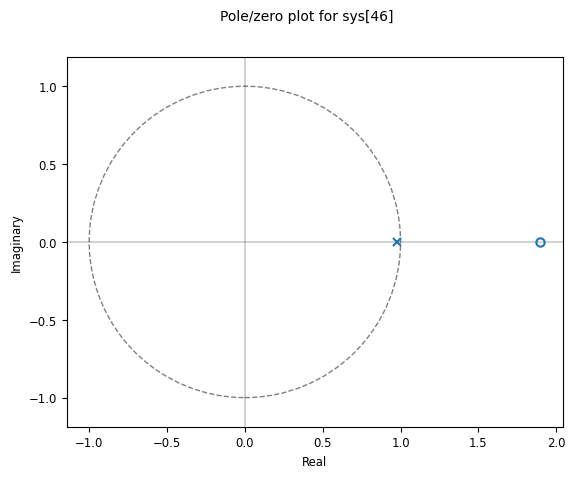

its regression yield r squared: 0.7396106742423703, Akaike's information criteria: -9164.183180759372
Athlete: A6M2

Model #11 
with 1 a parameters, 2 b parameters and 0 time delay
SSG: 126.20495751269046 SSG2: [126.20495751]
parameters a [0.98166618] Poles: 1.0186762232815156
parameters a2 [1, array([-0.98166618])] Poles2: [-1.01867622]
Time constant: -54.04247410790141


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


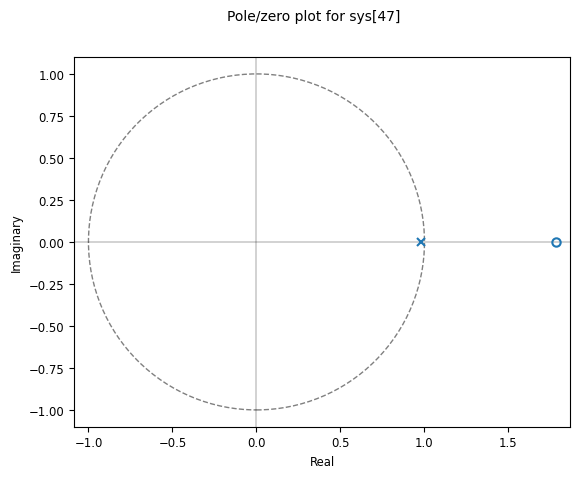

its regression yield r squared: 0.7332213832569769, Akaike's information criteria: -6465.832309395477


In [145]:
#Select one model and applie to all the datasets
number_a=1
number_b=2
d=0
one_4_all = pd.DataFrame(columns=['Athlete_Code', 'na', 'nb', 'd','SSG','TC' ,'AIC', 'Rsq','RMSE','BIC','FPE'])
model_count=0

for i in range(len(athlete_list)):
  data = athlete_list[i]
  print(f"Athlete: {code_name[i]}")
  print('\nModel #{} \nwith {} a parameters, {} b parameters and {} time delay'.format(model_count,number_a,number_b,d))
  #load the associated data using dataloader(data, na, nb, d)
  X_loader, y_loader = dataloader(data, number_a,  number_b, d)

  ##Calculate the a and b parameters
  # parameters vector [a0...an, b0...bm].T by the formula inv(X.T dot X) dot X.T dot y
  parameters = np.linalg.inv(X_loader.T.dot(X_loader)).dot(X_loader.T).dot(y_loader)
  parameters_a = parameters[:number_a]
  parameters_b = parameters[number_a:]


  ## Simulate values of Y
  ysim = np.zeros(len(y_loader)) # the plus one is because the first value is initialized and not simulated
  ysim[0]= y_loader.values[0] # initialize the first value
  max_lag= max(number_a,number_b+d-1)  # Maximum lag across both endogenous and exogenous variables

  for k in range(max_lag, len(X_loader)):
  # Add the contribution from autoregressive terms (endogenous variables)
    for i_a in range(1,number_a+1):
        #print("parameter a: ",i_a)
        ysim[k] += parameters_a[i_a-1] * ysim[k - i_a]  # Note: parameters_a starts at index 0

  # Add the contribution from exogenous input terms (with delay d)
    for j_b in range(number_b):
        #print("parameter b: ",j_b)
        ysim[k] += parameters_b[j_b] * X_loader['u-{}'.format(d+j_b)].iloc[k-j_b]  # Note: parameters_b starts at index 0
        #print('u-{}'.format(d+j_b),j_b,d)



  #Used? Needed?
  num = parameters_b # b [b1,b2,b3,...] (exogenous)
  den = [1, -parameters_a] #a [1,a2,a3,...] (endogenous)

  #Calculate SSG(K) and TC
  ##SSG = how much the output of a system changes in response to a change in the input.
  SSG = sum(parameters_b)/ (1 - sum(parameters_a)) #a unit change in the input (u) will result in a 1.33 unit change in the output (y)
  SSG2 = sum(num)/ (sum(den))
  print("SSG:", SSG,'SSG2:',SSG2)
  #Calculate the TC
  #Check if parameters_a has more than one element to avoid the error
  #if len(parameters_a) > 1:
  #    poles = 1/parameters_a[0]
  #else:
  #    poles = 1/parameters_a  # In case parameters_a has only one element
  poles = 1/parameters_a[0]
  print("parameters a", parameters_a, "Poles:", poles)
  poles2 = 1/den[1]
  print("parameters a2", den, "Poles2:", poles2)

  #Check if poles is an array before calculating dominant_pole
  #if isinstance(poles, np.ndarray):
  #    dominant_pole = poles[np.argmin(np.abs(poles.imag))] #get the dominant
  #else:
  #   dominant_pole = poles  # If poles is a scalar, directly assign to dominant_pole
  dominant_pole = poles

  tau = -1 / np.log(dominant_pole)
  print("Time constant:", tau)
  #tau2 = -1 / np.log(poles[np.argmin(np.abs(poles.imag))])
  #print("Time constant2:", tau2)



  #Models Stability
  num = parameters_b # b [b1,b2,b3,...] (exogenous)
  den1 =  np.insert(-parameters_a, 0, 1)
  den = [1] + (-parameters_a).tolist() #a [1,a2,a3,...] (endogenous)
  TF = ctrl.TransferFunction(num, den)    #define transfer function
  poles, zeroes = ctrl.pzmap(TF, plot=True)
  #add unit circle
  plt.gca().add_patch(plt.Circle((0, 0), radius=1, fill=False, color='gray', linestyle='--'))
  plt.show()

  #New Verions (TESTED, but NOT CONFIRMED TO DO THE SAME)
  #poles, zeroes = ctrl.pole_zero_map(TF)
  #ctrl.pole_zero_plot(TF)         #


  ## Model evaluation for each generated model use r_squared and aic def above
  n = len(y_loader)
  SSR = np.sum((y_loader - ysim) ** 2)
  #Calculate usefull Model evaluation parameters
  r_squared = r_2(y_loader, ysim)
  aic =  2 * (na + nb) + len(y_loader) * np.log(1 - r_squared) # Evaluates the complexicity of the Model
  Rmse = rmse(y_loader, ysim[0:])  #Root Mean Squared Error (Less sensitive to outliers: It is less affected by extreme errors compared to RMSE)
  fpe = SSR * (n + k) / (n - k)                  #Final Prediction Error(used for model order selection)(Considers both model fit and complexity) (Asymptotically equivalent to AIC: For large sample sizes, FPE and AIC tend to select the same model)
  bic = n * np.log(SSR / n) + k * np.log(n)


  new_row = pd.DataFrame({'Athlete_Code': code_name[i],'SSG':[SSG],'TC':[tau], 'Parameters_a':[parameters_a], 'Parameters_b':[parameters_b], 'na': [number_a], 'nb': [number_b], 'd': [d], 'AIC': [aic], 'Rsq': [r_squared],'RMSE':[Rmse], 'BIC':[bic],'FPE':[fpe]})

  one_4_all = pd.concat([one_4_all, new_row], ignore_index=True)



  print("its regression yield r squared: {}, Akaike's information criteria: {}".format(r_squared, aic))

  # Save relevant information to the empty lists
  #new_row = pd.DataFrame({'Athlete_Code': code_name[i],'Model_Index': [model_count], 'na': [na], 'nb': [nb], 'd': [d], 'AIC': [aic], 'Rsq': [r_squared],'RMSE':[Rmse], 'BIC':[bic],'FPE':[fpe]})
  #results_df = pd.concat([results_df, new_row], ignore_index=True)
        # Update the model counter
  model_count += 1



#Do the parameter estimates vary a lot between the subjects or between the volleyball matches?



In [70]:
one_4_all['Parameters_a'].str[0].tolist()

[0.9831793255399247,
 1.0009909635301741,
 0.9804510010888864,
 0.9890005447734485,
 0.9896160920989081,
 0.9862303921822357,
 0.9835041258970837,
 0.990672044361848,
 0.985767477022147,
 1.0007064738145246,
 0.9728140579158832,
 0.9850950968199306]

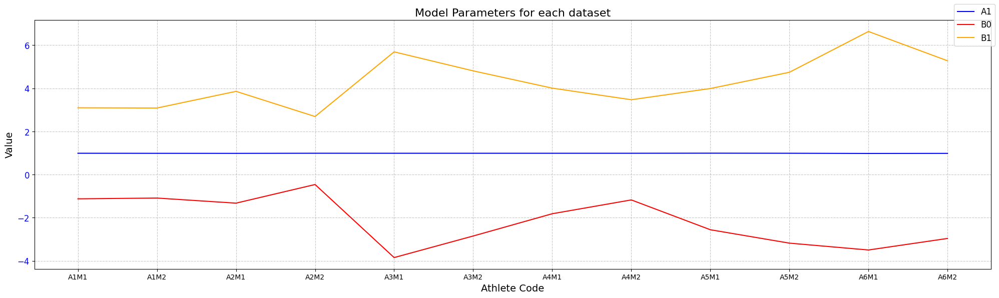

In [147]:
#Do the parameter estimates vary a lot between the subjects or between the volleyball matches?
athlete_codes = one_4_all['Athlete_Code'].to_list()

#Plot for each player/game
fig, ax1 = plt.subplots(figsize=(20, 6))
X_axis = athlete_codes #results_df['Model_Index']

#plot parameters A
ax1.plot(X_axis, one_4_all['Parameters_a'].str[0].tolist(), color='blue', label='A1')
#ax1.plot(X_axis, one_4_all['Param_a'].str[1].tolist(), color='blue', label='A2')
#ax1.plot(X_axis, one_4_all['Param_a'].str[2].tolist(), color='blue', label='A3')
ax1.set_xlabel('Athlete Code', fontsize=14)  # Increased font size
ax1.set_ylabel('Value', fontsize=14)  # Increased font size
ax1.tick_params(axis='y', labelcolor='blue', labelsize=12)  # Increased tick label size

#Plot parameters B
ax1.plot(X_axis, one_4_all['Parameters_b'].str[0].tolist(), color='red', label='B0')
ax1.plot(X_axis, one_4_all['Parameters_b'].str[1].tolist(), color='orange', label='B1')
#ax1.plot(X_axis, one_4_all['Param_b'].str[2].tolist(), color='red', label='B2')

'''#First param B
x2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
ax2.plot(X_axis, one_4_all['Param_b'].str[0].tolist(), color='red', label='AIC')
#ax2.plot(X_axis, one_4_all['Param_b'].str[1].tolist(), color='red', label='AIC')
ax2.set_ylabel('Param_b', color='red', fontsize=14)  # Increased font size
ax2.tick_params(axis='y', labelcolor='red', labelsize=12)  # Increased tick label size
'''


# General graphic configs
fig.legend(loc="upper right", fontsize=12)  # Add a legend for both plots, increased font size
ax1.grid(True, linestyle='--', alpha=0.7)  # Added grid with dashed lines and transparency
ax2.grid(True, linestyle='--', alpha=0.7)  # Added grid with dashed lines and transparency
plt.title('Model Parameters for each dataset', fontsize=16)  # Added title with increased font size
plt.tight_layout()  # Adjust layout to prevent overlapping elements
plt.show()


In [72]:
den, num

([1, -0.9850950968199306], array([ 14.02555603, -11.25329596]))

In [73]:
one_4_all

,Athlete_Code,na,nb,d,SSG,TC,AIC,Rsq,RMSE,BIC,FPE,Parameters_a,Parameters_b
0,A1M1,1,2,0,125.306858,-58.949235,28.245877,-0.001842,8.528570,102490.629515,8.716628e+09,[0.9831793255399247],"[1.98501275303857, 0.12273310782569713]"
1,A1M2,1,2,0,-155.770060,1009.618790,38622.877802,-5769.896546,1623.580288,103360.284942,1.047632e+14,[1.0009909635301741],"[1.8012763725107865, -1.6469139236675336]"
2,A2M1,1,2,0,163.088147,-50.651869,29.380756,-0.001989,9.577656,104286.715305,1.099296e+10,[0.9804510010888864],"[4.230046777190026, -1.041836769779391]"
3,A2M2,1,2,0,293.957914,-90.412672,450.201357,-0.102794,12.079916,59664.352579,5.799482e+09,[0.9890005447734485],"[8.066811226451263, -4.833434317160689]"
4,A3M1,1,2,0,234.830280,-95.801987,673.885198,-0.118488,10.246998,78577.360804,7.292212e+09,[0.9896160920989081],"[12.887724912729322, -10.44926890903714]"
5,A3M2,1,2,0,171.535371,-72.122554,27.359556,-0.002893,6.514964,56345.260332,1.814858e+09,[0.9862303921822357],"[12.905566946808133, -10.543592162131574]"
6,A4M1,1,2,0,104.838267,-60.119833,698.381473,-0.105541,15.314190,97431.346956,2.182138e+10,[0.9835041258970837],"[1.2594256452479284, 0.4699732004907948]"
7,A4M2,1,2,0,141.994605,-106.703846,2992.587019,-0.835614,25.252478,73334.034490,3.066865e+10,[0.990672044361848],"[5.301121639163252, -3.9766022586200407]"
8,A5M1,1,2,0,163.686531,-69.760417,75.688927,-0.009085,9.789155,91326.488518,8.916301e+09,[0.985767477022147],"[6.706034553937164, -4.376362242452145]"
9,A5M2,1,2,0,-103.353639,1415.980571,36187.903530,-1596.839582,1020.886405,109618.752794,5.012351e+13,[1.0007064738145246],"[11.027851333109698, -10.954834693490916]"


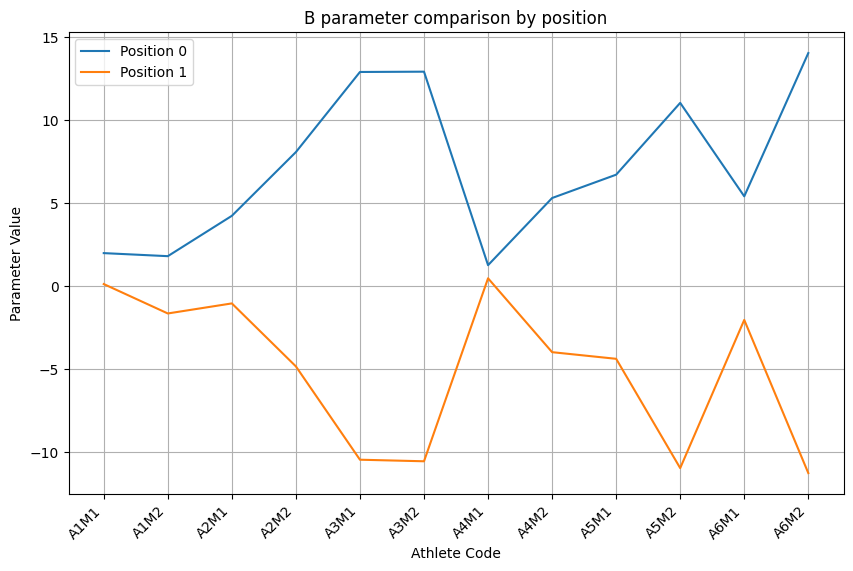

In [74]:
import matplotlib.pyplot as plt
import numpy as np

# Extract the 'b' parameter values and athlete codes
b_values = one_4_all['Parameters_b'].to_list()
athlete_codes = one_4_all['Athlete_Code'].to_list()

num_athletes = len(athlete_codes)
num_params = len(b_values[0])  # Assuming all athletes have the same number of 'b' parameters

# Create an array to store the parameter values for each position
param_positions = [[] for _ in range(num_params)]
for athlete_params in b_values:
    for i, param_value in enumerate(athlete_params):
        param_positions[i].append(param_value)

# Create the plot
plt.figure(figsize=(10, 6))  # Adjust figure size as needed

for i, position_values in enumerate(param_positions):
    plt.plot(athlete_codes, position_values, label=f"Position {i}")

# Customize the plot
plt.xlabel("Athlete Code")
plt.ylabel("Parameter Value")
plt.title("B parameter comparison by position")
plt.legend()
plt.grid(True)
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability

plt.show()

In [75]:
best_models_df

,Athlete_Code,na,nb,d,Ranking,AIC_rank,Rsq_rank,BIC_rank,Rsq,AIC,BIC,FPE,Parameters_a,Parameters_b
0,A1M1,1,1,4,25.0,4.0,10.0,11.0,-0.000863,10.675978,102447.219515,8.709099e+09,"[2.2163682560758593, -1.8072444635883933, 0.58...","[2.4401810020284462, -1.795462083397855, -1.89..."
1,A1M2,0,4,0,28.0,4.0,4.0,20.0,-0.194198,798.829029,64660.855757,1.789686e+10,"[2.2163682560758593, -1.8072444635883933, 0.58...","[2.4401810020284462, -1.795462083397855, -1.89..."
2,A2M1,1,1,4,35.0,1.0,5.0,29.0,-0.000327,6.531786,104448.574456,1.127974e+10,"[2.2163682560758593, -1.8072444635883933, 0.58...","[2.4401810020284462, -1.795462083397855, -1.89..."
3,A2M2,1,4,0,5.0,1.0,1.0,3.0,-0.099963,434.550941,59677.410082,5.848926e+09,"[2.2163682560758593, -1.8072444635883933, 0.58...","[2.4401810020284462, -1.795462083397855, -1.89..."
4,A3M1,1,3,0,4.0,1.0,1.0,2.0,-0.115785,653.518143,78594.838170,7.329203e+09,"[2.2163682560758593, -1.8072444635883933, 0.58...","[2.4401810020284462, -1.795462083397855, -1.89..."
5,A3M2,1,4,0,7.0,3.0,2.0,2.0,-0.002633,22.152384,56045.909079,1.709296e+09,"[2.2163682560758593, -1.8072444635883933, 0.58...","[2.4401810020284462, -1.795462083397855, -1.89..."
6,A4M1,2,2,0,59.0,22.0,22.0,15.0,-0.007058,55.972578,94894.465090,1.504383e+10,"[2.2163682560758593, -1.8072444635883933, 0.58...","[2.4401810020284462, -1.795462083397855, -1.89..."
7,A4M2,0,1,0,42.0,1.0,1.0,40.0,-0.091977,433.587956,70719.005019,1.794408e+10,"[2.2163682560758593, -1.8072444635883933, 0.58...","[2.4401810020284462, -1.795462083397855, -1.89..."
8,A5M1,2,4,4,54.0,4.0,1.0,49.0,-0.000576,15.927574,93712.852101,1.279371e+10,"[2.2163682560758593, -1.8072444635883933, 0.58...","[2.4401810020284462, -1.795462083397855, -1.89..."
9,A5M2,0,4,0,13.0,7.0,5.0,1.0,-0.017053,90.889247,71005.103722,1.917940e+10,"[2.2163682560758593, -1.8072444635883933, 0.58...","[2.4401810020284462, -1.795462083397855, -1.89..."


In [144]:
one_4_all

,Athlete_Code,na,nb,d,SSG,TC,AIC,Rsq,RMSE,BIC,FPE,Parameters_a,Parameters_b
0,A1M1,1,2,0,160.039839,-57.286272,-9410.873061,0.704039,9.268437,103778.624454,1.029459e+10,[0.9826952873285772],"[0.4022585445253398, 2.3671848770744703]"
1,A1M2,1,2,0,127.284157,-47.495153,-6897.928418,0.787849,6.434687,54048.689906,1.645570e+09,[0.9791653245621591],"[1.5603586916546757, 1.0915654120297402]"
2,A2M1,1,2,0,145.316915,-36.559201,-9531.209346,0.708604,9.297260,103826.696497,1.035872e+10,[0.9730178074021362],"[3.379752451911208, 0.5412165473137712]"
3,A2M2,1,2,0,192.083817,-44.427226,-6604.145980,0.773397,9.058653,57098.115369,3.261284e+09,[0.9777427108840417],"[4.079384656104831, 0.19588039308383168]"
4,A3M1,1,2,0,147.539298,-47.268094,-8354.202709,0.758292,7.768359,75313.512763,4.191067e+09,[0.9790662968461543],"[2.077662042635248, 1.0108818158685517]"
5,A3M2,1,2,0,154.973122,-53.995792,-9735.994111,0.878588,6.080275,55706.670602,1.580757e+09,[0.9816504790031556],"[-0.37962882767623185, 3.2233113790746746]"
6,A4M1,1,2,0,171.342052,-45.034647,-7009.354924,0.642874,11.536400,93566.942453,1.238326e+10,[0.9780395932771416],"[0.8188814187592823, 2.943859740560381]"
7,A4M2,1,2,0,186.171180,-45.817628,-5478.766737,0.673739,12.431504,66383.199537,7.432485e+09,[0.9784107959063497],"[2.489596626862486, 1.5296909719900356]"
8,A5M1,1,2,0,229.342028,-87.133095,-13826.497771,0.868546,10.548267,92345.360481,1.035277e+10,[0.9885889105100223],"[-0.9366810307051994, 3.553723436776973]"
9,A5M2,1,2,0,125.793471,-48.478724,-7095.146635,0.765351,8.734058,62920.937651,3.668755e+09,[0.9795836879962346],"[-0.14553897342985422, 2.713777728423583]"


Game1: 0.5758721655467564


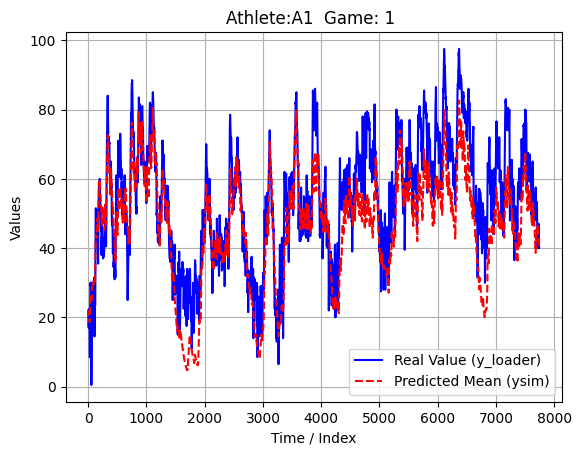

Game2: 0.6683332976500234


<ipython-input-148-edc9845d6e87>:101: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  athlete_mean_model = pd.concat([athlete_mean_model, new_row], ignore_index=True)


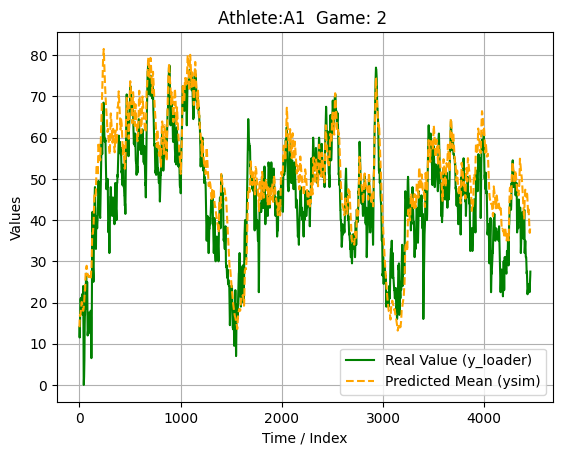

Game1: -0.04394282830735774


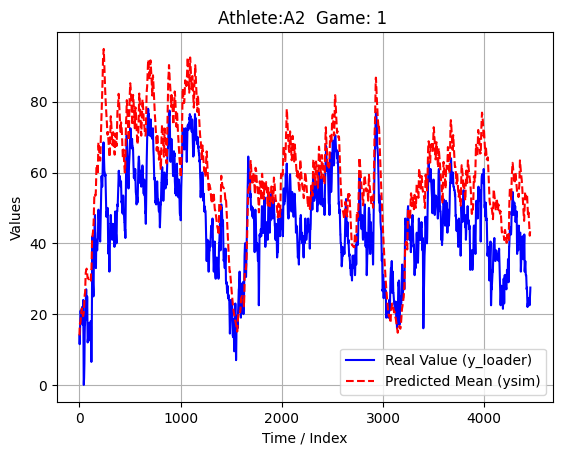

Game2: 0.5321112949995722


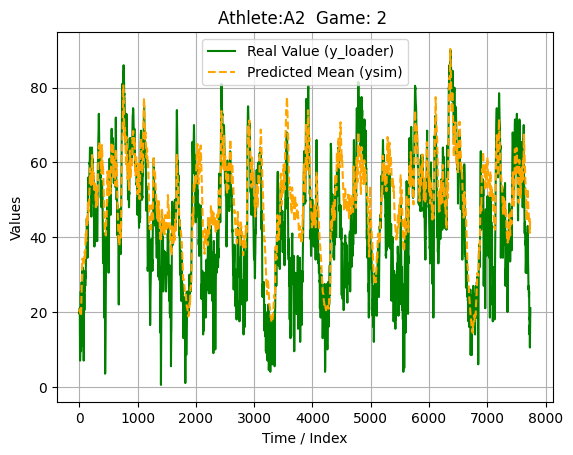

Game1: 0.5847694051895169


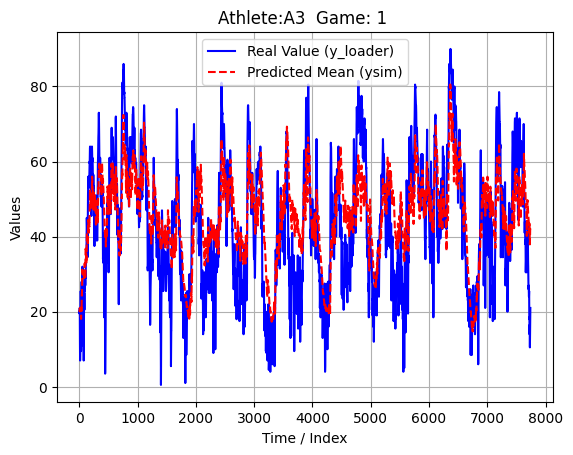

Game2: 0.210430789828296


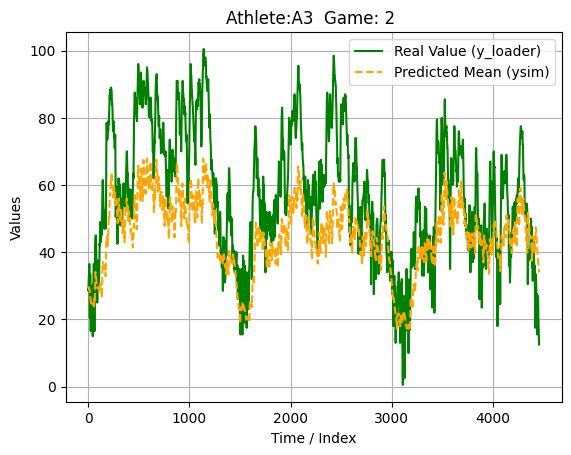

Game1: 0.6368192105348505


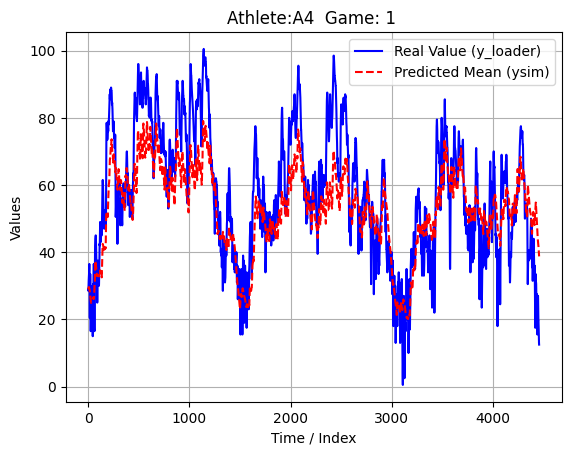

Game2: 0.5511610447330311


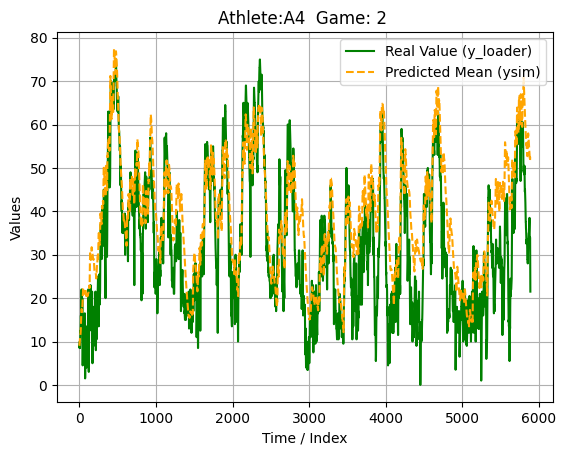

Game1: 0.660385055539162


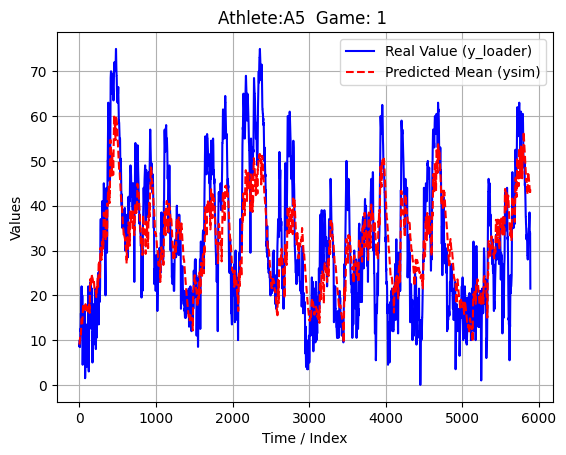

Game2: 0.7558844760504878


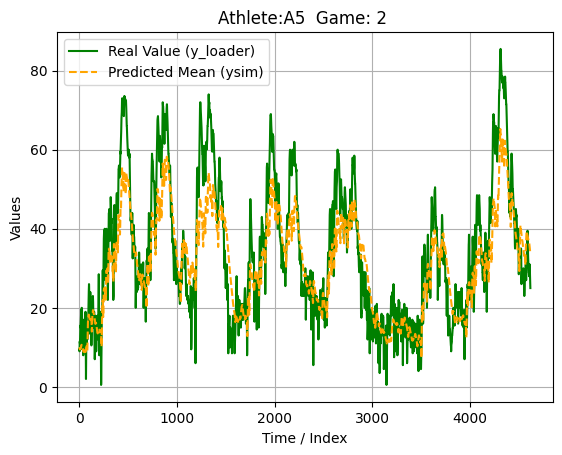

Game1: 0.8104888607359589


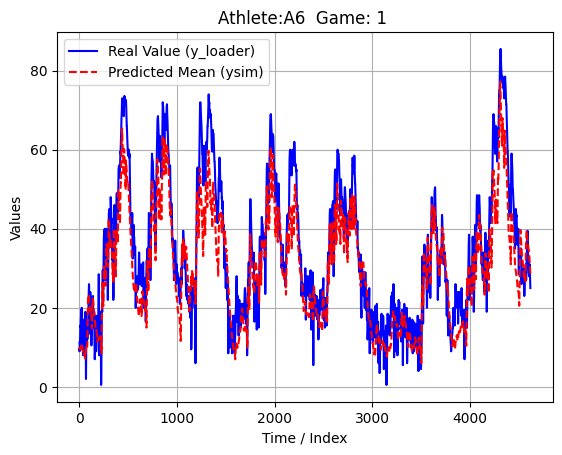

Game2: 0.29821462414954525


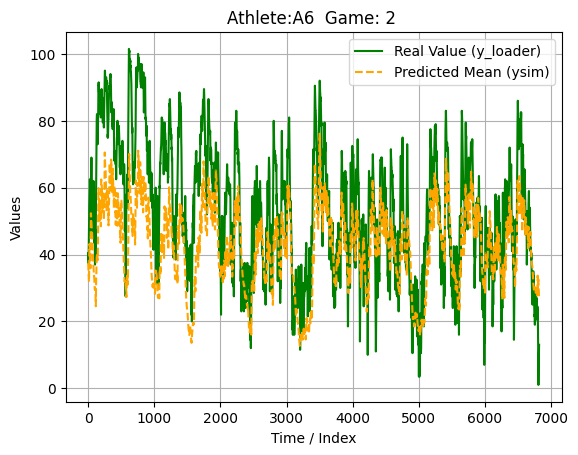

In [148]:
# Biological interpretation

#First Order Model
##
#  Code Here
##


#Second Order Model
##
#  Code Here
##




#Athlete Average Moder
#structure: 1:2:0
#for p_case in best_models_df.iterrows():
counter = 0
number_a=1
number_b=2
d=0
athlete_mean_model = pd.DataFrame(columns=['Athlete', 'Parameters_a', 'Parameters_b', 'Rsq_M1', 'AIC_M1', 'Rsq_M2', 'AIC_M2'])

for pcase in one_4_all.iterrows():
  #print(pcase)

  if pcase[1]["Athlete_Code"][3] == '1':    #First Game
    params_a_memory = pcase[1]['Parameters_a']
    params_b_memory = pcase[1]['Parameters_b']
    counter += 1

  else: #second game
    mean_a = (params_a_memory + pcase[1]['Parameters_a']) / 2
    mean_b = (params_b_memory + pcase[1]['Parameters_b']) / 2

    #Simulation
    #Simulation for first Game
    X_loader, y_loader = dataloader(athlete_list[counter-1], number_a, number_b, d)
    ## Simulate values of Y
    ysim = np.zeros(len(y_loader)) # the plus one is because the first value is initialized and not simulated
    ysim[0]= y_loader.values[0] # initialize the first value
    max_lag= max(number_a,number_b+d-1)  # Maximum lag across both endogenous and exogenous variables
    for k in range(max_lag, len(X_loader)):
      for i_a in range(1,number_a+1):
          ysim[k] += mean_a[i_a-1] * ysim[k - i_a]  # Note: parameters_a starts at index 0
      for j_b in range(number_b):
          ysim[k] += mean_b[j_b] * X_loader['u-{}'.format(d+j_b)].iloc[k-j_b]  # Note: parameters_b starts at index 0
    #Calculate SSG(K) and TC
    SSG = sum(mean_b)/ (1 - sum(mean_a)) #a unit change in the input (u) will result in a 1.33 unit change in the output (y)
    poles = 1/mean_a[0]
    dominant_pole = poles
    tau = -1 / np.log(dominant_pole)
    #model metrics
    r_squared1, aic1, Rmse1, bic1, fpe1 = model_metrics(y_loader,ysim,number_a,number_b)
    #Plot Simulation
    print("Game1:",r_squared1)
    plt.plot(y_loader, label='Real Value (y_loader)', color='blue')
    plt.plot(np.arange(len(ysim)), ysim, label='Predicted Mean (ysim)', color='red', linestyle='--')
    plt.xlabel('Time / Index')
    plt.ylabel('Values')
    plt.title('Athlete:{}  Game: 1 '.format(pcase[1]['Athlete_Code'][:2]))
    plt.legend()  # Add a legend
    plt.grid(True) # Add grid lines for better readability
    plt.show()


      ##Simulation for Second Game
    X_loader, y_loader = dataloader(athlete_list[counter], number_a, number_b, d)
    # Simulate values of Y
    ysim = np.zeros(len(y_loader)) # the plus one is because the first value is initialized and not simulated
    ysim[0]= y_loader.values[0] # initialize the first value
    max_lag= max(number_a,number_b+d-1)  # Maximum lag across both endogenous and exogenous variables
    for k in range(max_lag, len(X_loader)):
      for i_a in range(1,number_a+1):
          ysim[k] += mean_a[i_a-1] * ysim[k - i_a]  # Note: parameters_a starts at index 0
      for j_b in range(number_b):
          ysim[k] += mean_b[j_b] * X_loader['u-{}'.format(d+j_b)].iloc[k-j_b]  # Note: parameters_b starts at index 0
    #Calculate SSG(K) and TC
    SSG = sum(mean_b)/ (1 - sum(mean_a)) #a unit change in the input (u) will result in a 1.33 unit change in the output (y)
    poles = 1/mean_a[0]
    dominant_pole = poles
    tau = -1 / np.log(dominant_pole)
    #model metrics
    r_squared2, aic2, Rmse2, bic2, fpe2 = model_metrics(y_loader,ysim,number_a,number_b)
    #Plot Simulation
    print("Game2:",r_squared2)
    plt.plot(y_loader, label='Real Value (y_loader)', color='green')
    plt.plot(np.arange(len(ysim)), ysim, label='Predicted Mean (ysim)', color='orange', linestyle='--')
    plt.xlabel('Time / Index')
    plt.ylabel('Values')
    plt.title('Athlete:{}  Game: 2 '.format(pcase[1]['Athlete_Code'][:2]))
    plt.legend()  # Add a legend
    plt.grid(True) # Add grid lines for better readability



    #Save to the Dataframe
    new_row = pd.DataFrame({'Athlete': [pcase[1]['Athlete_Code'][:2]],'Parameters_a':[mean_a], 'Parameters_b':[mean_b], 'Rsq_M1':[r_squared1], 'AIC_M1':[aic1], 'Rsq_M2':[r_squared2], 'AIC_M2':[aic2]})
    athlete_mean_model = pd.concat([athlete_mean_model, new_row], ignore_index=True)
    plt.show()







In [78]:
athlete_mean_model

,Athlete,Parameters_a,Parameters_b,Rsq_M1,AIC_M1,Rsq_M2,AIC_M2
0,A1,[0.9920851445350494],"[1.8931445627746784, -0.7620904079209183]",-0.079773,600.125053,-38.303596,16372.726851
1,A2,[0.9847257729311674],"[6.148429001820644, -2.9376355434700403]",-67.155368,18826.739452,-0.197649,1402.170473
2,A3,[0.9879232421405719],"[12.896645929768727, -10.496430535584357]",-0.118799,874.974273,-0.469241,1721.196807
3,A4,[0.9870880851294659],"[3.2802736422055903, -1.753314529064623]",-0.992878,3080.146774,-0.563910,2641.286817
4,A5,[0.9932369754183358],"[8.866942943523432, -7.665598467971531]",-0.315193,1620.585253,-0.001835,14.475765
5,A6,[0.9789545773679069],"[9.71456577347471, -6.644442317952959]",-0.046442,215.912381,-0.682032,3552.936449


 # Time-varying dynamics

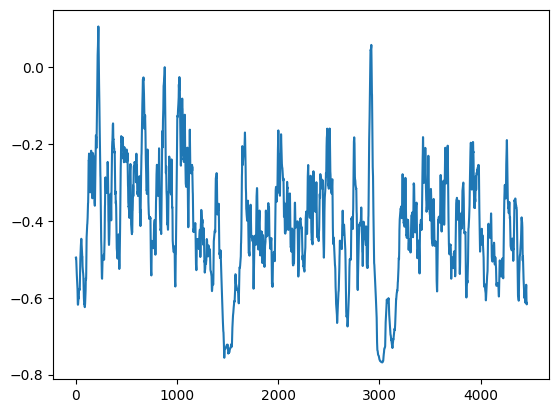

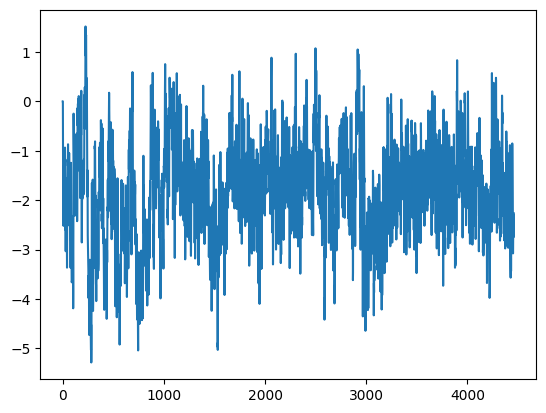

In [79]:
na = 2
nb = 1
d = 1

#INCORPORATE ASSIGNMENT DATA
X_loader, y_loader = dataloader(athlete_list[1], na, nb, d)
N = len(y_loader)
y = y_loader#.values.reshape(-1,1)
u = X_loader['u-{}'.format(d)].values.reshape(-1,1)

N = len(y_loader)
t = np.arange(N)                                        # example for 'time'/points 0-(N-1)
f = 2 * np.pi / 40                                      # f = chosen frequence for square wave


e = np.random.randn(N, 1) * np.sqrt(0.16)               # Noise vector e-N(0,0.16), 'standard normal distribution'is mean 0, standard deviation 1.
a1 = np.ones((N,1)) * -1                                # a1 = constant
a2 = np.ones((N,1)) * 0.25                              # a2 = constant (if you have a2 means it is second order system)
b0 = np.ones((N,1))
b0[200:899] = 2                                         # b0 = variable
# delay = 1


y = np.zeros((N,1))                                     # start with an empty vector for y
for k in range(max(na, nb+d-1), N):
    y[k] = -a1[k] * y[k-1] - a2[k] * y[k-2] + b0[k] * u[k-d] + e[k]  # if we have a2 means it is a second order system.

plt.plot(u)
plt.show()
plt.plot(y)

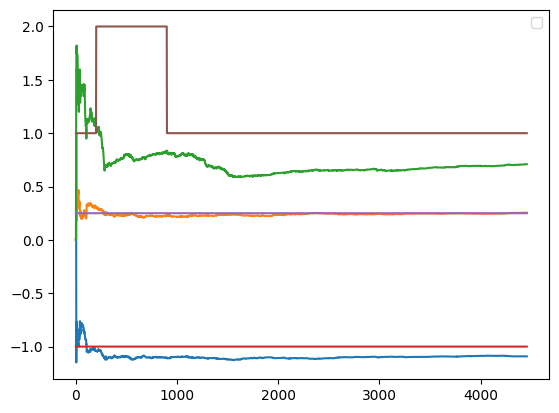

R2: -0.03917559535702009


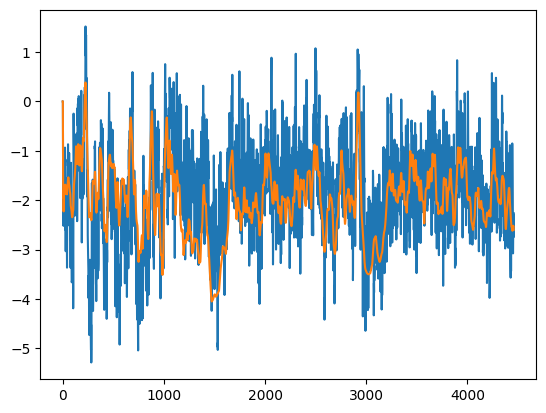

In [80]:
# Time-variant - recursive ARX

dm = 3                              # Number of parameters to estimate
# Initialise matrix
X = np.zeros((dm,1))              # prepare an input matrix that can be used in the loop, size is the number of parameters
P = 1000 * np.eye(dm)            # Covariance matrix set to large value because of uncertainty at the beginning due to lack of measurement
a_hat = np.ones((dm,1))         # Minimum value to not create error in case of 0 division


# Information to be stored in the loop
a1est = np.zeros((N,1))
a2est = np.zeros((N,1))
b0est = np.zeros((N,1))


# Loop over all the data
for k in range(max(na, nb+d-1), N):
    # 1. Update the matrix X with the new data
    X[0] = - y[k-1]
    X[1] = - y[k-2]
    X[2] = u[k-d]

    # 2. Update gain matrix g
    g = (P @ X) / (1 +( X.T @ P @ X))

    # 3. Update covariance matrix P
    P = P - g @ X.T @ P

    # 4. Re-estimate the parameter coefficients
    yhat =  X.T @ a_hat      # y = data vector * parameters vetor
    error = y[k] - yhat
    a_hat = a_hat + g * error
    # OR: a_hat = a_hat + g * ( y(k) - (X' * a_hat))

    # 5. Store estimates (get the diagonal elements of a_hat that correspond to a1, a2, b0)
    a1est[k] = a_hat[0]
    a2est[k] = a_hat[1]
    b0est[k] = a_hat[2]

# Simulate model (step 2)
ysim2 = np.zeros((N,1))
for k in range(max(na, nb+d-1), N):
    ysim2[k] = - a1est[k] * ysim2[k-1] - a2est[k] * ysim2[k-2] + b0est[k] * u[k-d]

plt.plot(a1est)
plt.plot(a2est)
plt.plot(b0est)

plt.plot(a1)
plt.plot(a2)
plt.plot(b0)
plt.legend()
plt.show()

plt.plot(y)
plt.plot(ysim2)

print('R2:',r_2(y, ysim2))


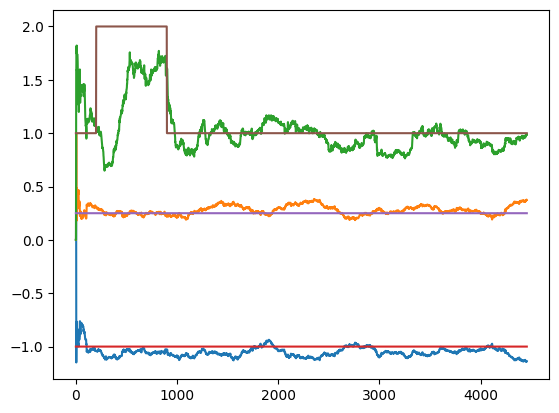

R2: -0.00012892763416894049


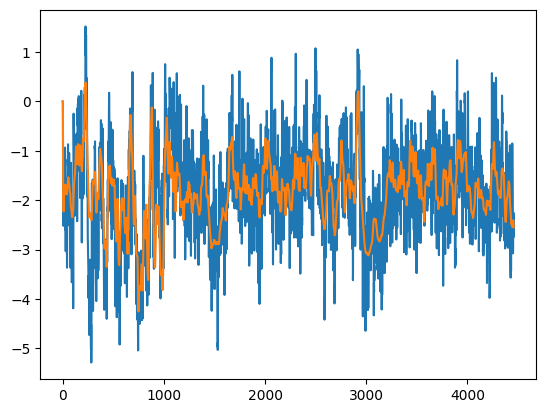

In [81]:
#Time-variant - recursive ARX RDW (rectancular data weighing)
Win = 350;                  # window size
# Initialise matrix
X_add = np.zeros((dm,1))
X_remove = np.zeros((dm,1))
P = 1000 * np.eye(dm)             # Covariance matrix set to large value because of uncertainty at the beginning due to lack of measurement
A_hat = np.ones((dm,1))           # Minimum value to don't create error in case of 0 division
# Information to be stored in the loop
a1est = np.zeros((N,1))
a2est = np.zeros((N,1))
b0est = np.zeros((N,1))

for k in range(max(na, nb+d-1), N):
    # 1. Update the matrix X with the new data
    X_add[0] = -y[k-1]
    X_add[1] = -y[k-2]
    X_add[2] = u[k-1]

    # 2. Update gain matrix
    g = P @ X_add / (1 + X_add.T @ P @ X_add)  # inverse of matrix is 'devision'

    # 3. Update covariance matrix P
    P = P - g @ X_add.T @ P

    # 4. Re-estimate the parameter coefficients based on the new data
    yhat = X_add.T @ A_hat
    error = y[k] - yhat
    A_hat = A_hat + g * error

    # 5 Remove effect of old data every data at (k-s)th instant
    if k - Win - max(nb + d - 1, na) > 0:
        # 5.a Update the matrix X(k-s) with the new data
        X_remove[0] = -y[k - Win - 1] #a1
        X_remove[1] = -y[k - Win - 2] #a2
        X_remove[2] = u[k - Win - d] #b0
        # 5.b Update gain matrix
        g = -P @ X_remove / (1 + X_remove.T @ P @ X_remove)
        # 5.c Update covariance matrix P
        P = (P - g @ X_remove.T @ P)
        # 5.d Re-estimate the parameter coefficients based on the new data
        yhat = X_remove.T @ A_hat
        error = y[k - Win] - yhat
        A_hat = A_hat + g * error

    a1est[k] = A_hat[0]
    a2est[k] = A_hat[1]
    b0est[k] = A_hat[2]

# Simulate model (step 3)
ysim3 = np.zeros((N,1))
for k in range(max(na, nb+d-1), N):
    ysim3[k] = -a1est[k] * ysim3[k-1] - a2est[k] * ysim3[k-2] + b0est[k] * u[k-d]


plt.plot(a1est)
plt.plot(a2est)
plt.plot(b0est)
plt.plot(a1)
plt.plot(a2)
plt.plot(b0)
plt.show()
plt.plot(y)
plt.plot(ysim3)

print('R2:',r_2(y, ysim3))




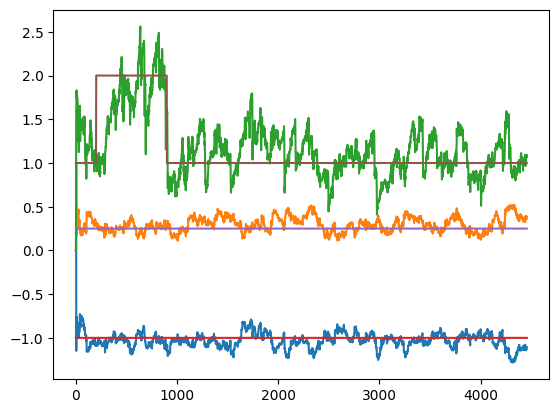

R2: -5.056846167741853


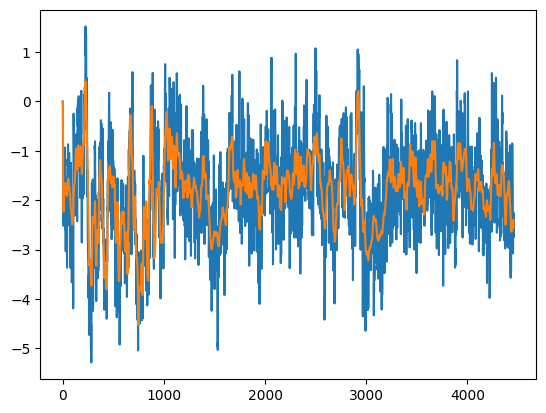

In [82]:
#Step 4 - Time-varying recursive ARX with EWP (exponentially weighted past)
Alpha = 0.985

# Initialise matrix
X = np.zeros((dm,1))
P = 1000 * np.eye(dm)             # Covariance matrix set to large value because of uncertainty at the beginning due to lack of measurement
a_hat = np.ones((dm,1))       # Minimum value to don't create error in case of 0 division
# Information to be stored in the loop
a1est = np.zeros((N,1))
a2est = np.zeros((N,1))
b0est = np.zeros((N,1))

#Loop over all the data
for k in range(max(na, nb+d-1), N):

    # 1. Update the matrix X with the new data
    X[0] = -y[k-1]
    X[1] = -y[k-2]
    X[2] = u[k-d]

    # 2. Update gain matrix
    g = P @ X / (Alpha + X.T @ P @ X)

    # 3. Update covariance matrix P
    P = (P - g @ X.T @ P) / Alpha

    # 4. Re-estimate the parameter coefficients based on the new data
    yhat = X.T @ a_hat
    error = y[k] - yhat
    a_hat = a_hat + g * error

    a1est[k] = a_hat[0]
    a2est[k] = a_hat[1]
    b0est[k] = a_hat[2]


# Simulate model
ysim4 = np.zeros((N,1))

for k in range(max(na, nb+d-1), N):
    ysim4[k] = -a1est[k] * ysim4[k-1] - a2est[k] * ysim4[k-2] + b0est[k] * u[k-d]

plt.plot(a1est)
plt.plot(a2est)
plt.plot(b0est)

plt.plot(a1)
plt.plot(a2)
plt.plot(b0)
plt.show()
plt.plot(y)
plt.plot(ysim4)

print('R2:',r_2(y_loader.values.ravel(), ysim4))


In [83]:
#2ºSystem Identification
def calcmodel(data, na, nb, d):
    # Load the associated data using dataloader(data, na, nb, d)

    X_loader, y_loader = dataloader(data, na, nb, d)


    # Estimate the a and b parameters vector [a0...an, b0...bm].T by the formula inv(X.T dot X) dot X.T dot y
    params = np.linalg.inv(X_loader.T @ X_loader) @ X_loader.T @ y_loader
    #params = np.linalg.solve(X_loader.T, X_loader) @ X_loader.T @ y_loader
    params = params.values


    parameters_a = params[:na]
    parameters_b = params[na:]


    # Optional: Calculate the predicted values of Y via Matrix-Vector multiplication (this is for prediction, not simulation)
    Y_pred = np.dot(X_loader, params)


    #Calculate a simulation using the predicted parameters use the following structure:
    ysim = np.zeros((len(X_loader)+1,1))  # the plus one is because the first value is initialized and not simulated

    ysim[0] = y_loader.values[0]    # initialize the first value
    max_lag = max(na, nb + d)  # Maximum lag across both endogenous and exogenous variables

    for k in range(max_lag, len(X_loader)):
        #Add the contribution from autoregressive terms (endogenous variables)
        for i_a in range(1, na + 1):
            #ysim[k] += parameters_a[i_a - 1] * ysim[k - i_a]
            ysim[k] += parameters_a[i_a - 1] * X_loader.iloc[k, i_a]

        #Add the contribution from exogenous input ter\ms (with delay d)
        for j_b in range(1, nb + 1):
            #ysim[k] += estimation[i_a - 1] * ysim[k - i_a - X_loader['u-{}'.format(d)]]                    #to get the column at delay u-d use this syntax X_loader['u-{}'.format(d)]
            ysim[k] += parameters_b[j_b-1] * X_loader['u-{}'.format(d)].iloc[k-j_b]


    # Calculate r-squared
    y_loader = y_loader.values.reshape(-1,1)
    SS_res = np.sum((y_loader - ysim[1:]) ** 2)  # Residual sum of squares
    SS_tot = np.sum((y_loader - np.mean(y_loader)) ** 2)  # Total sum of squares
    rsq = 1 - (SS_res / SS_tot)
    #print("ss_red:",SS_res,"ss_tot",SS_tot,"RSQ:",rsq)


    # Calculate AIC
    n = len(y_loader)  # Number of observations
    # Number of parameters (including intercept)
    aic =  2 * (na + nb) + len(y_loader) * np.log(1 - rsq) # Evaluates the complexicity of the Model


    return Y_pred, ysim, params, rsq, aic




print(calcmodel(data,0,1,0))
print(calcmodel(data,1,0,0))


(array([18.88177115, 17.65295747, 15.89037339, ...,  5.40977729,
        4.73542832,  4.55560193]), array([[ 1.        ],
       [18.88177115],
       [17.65295747],
       ...,
       [ 5.40977729],
       [ 4.73542832],
       [ 0.        ]]), array([113.89004819]), -0.7401874085274478, 2719.334750103777)


IndexError: index 1 is out of bounds for axis 0 with size 1

In [ ]:
pds = pd.DataFrame(columns=["Athlete", "na", "nb", "d", "Params", "RSQ", "AIC"])

# Parameter ranges
na_max = nb_max = xdelay_max = 3

for i in range(len(athlete_list)):
    print(f"Athlete: {code_name[i]}")


In [ ]:
pds

In [ ]:
# Initialize an empty DataFrame to store results
pds = pd.DataFrame(columns=["Athlete", "na", "nb", "d", "Params", "RSQ", "AIC"])

# Parameter ranges
na_max = nb_max = xdelay_max = 3
# Iterate over each athlete
for i in range(len(athlete_list)):
    print(f"Athlete: {code_name[i]}")
    athlete = athlete_list[i]
    # Iterate over possible values of na, nb, and d
    for na in range(1,na_max+1):
      for nb in range(1,nb_max+1):
        for d in range(1,xdelay_max+1):
              # Calculate model with specified parameters
              Y_pred, ysim, params, rsq, aic = calcmodel(athlete, na=na, nb=nb, d=d)


              # Add the result as a new row to the DataFrame
              pds = pd.concat([pds, pd.DataFrame({
                  "Athlete": f"{code_name[i]}",
                  "na": [na],
                  "nb": [nb],
                  "d": [d],
                  "Params": [params],
                  "RSQ": [rsq],
                  "AIC": [aic]
              })], ignore_index=True)

# Display final DataFrame with all results
#print(pds)


#Logs
'''
Run   Time
1     24:23       #First version(5)
2     24:23          #Add to dataframe(5)
3     25:xx        #No Idea(5)
4     5:xx         #Normal(3)
'''

In [ ]:

A1M1 = pds[pds['Athlete'] == "A4M1"]
percentile_75_1 = A1M1['AIC'].quantile(0.9)
percentile_75_2 = np.percentile(A1M1['AIC'],90)
#print(percentile_75_1, percentile_75_2)
#A1M1 = A1M1[A1M1['RSQ'] >= percentile_75]
#print(A1M1)

percentile_95 = A1M1['RSQ'].quantile(0.75)
fig, ax1 = plt.subplots()
plt.figure(figsize=(10, 6))
ax1.plot(A1M1["RSQ"])
ax1.set_xlabel('Model')
ax1.set_ylabel('RSQ')
ax2 = ax1.twinx()
ax2.plot(A1M1["AIC"], color='red')
ax2.set_ylabel('AIC', color='red')
ax1.legend(['RSQ'], loc='upper left')
ax2.legend(['AIC'], loc='upper right')
plt.show()
#pds
#Logs
'''
Total: 1500 Models
'''
A1M1[['na', 'nb','d','RSQ','AIC']][0:]

In [ ]:
#3 Biological interpretation

# 2º Practical assignment

In [ ]:
uploaded = files.upload()

In [ ]:
# Mutant 334

M334_C1_In_df = pd.read_csv('Mutation334_C1_In.csv', names=['u'])
M334_C2_In_df = pd.read_csv('Mutation334_C2_In.csv', names=['u'])
M334_C3_In_df = pd.read_csv('Mutation334_C3_In.csv', names=['u'])
M334_C4_In_df = pd.read_csv('Mutation334_C4_In.csv', names=['u'])
M334_C5_In_df = pd.read_csv('Mutation334_C5_In.csv', names=['u'])
M334_C6_In_df = pd.read_csv('Mutation334_C6_In.csv', names=['u'])

M334_C1_Out_df = pd.read_csv('Mutation334_C1_Out.csv', names=['y'])
M334_C2_Out_df = pd.read_csv('Mutation334_C2_Out.csv', names=['y'])
M334_C3_Out_df = pd.read_csv('Mutation334_C3_Out.csv', names=['y'])
M334_C4_Out_df = pd.read_csv('Mutation334_C4_Out.csv', names=['y'])
M334_C5_Out_df = pd.read_csv('Mutation334_C5_Out.csv', names=['y'])
M334_C6_Out_df = pd.read_csv('Mutation334_C6_Out.csv', names=['y'])

Mutant_334_list = [M334_C1_In_df,
M334_C2_In_df,
M334_C3_In_df,
M334_C4_In_df,
M334_C5_In_df,
M334_C6_In_df,
M334_C1_Out_df,
M334_C2_Out_df,
M334_C3_Out_df,
M334_C4_Out_df,
M334_C5_Out_df,
M334_C6_Out_df]

# Mutant 343

M343_C1_In_df = pd.read_csv('Mutation343_C1_In.csv', names=['u'])
M343_C2_In_df = pd.read_csv('Mutation343_C2_In.csv', names=['u'])
M343_C3_In_df = pd.read_csv('Mutation343_C3_In.csv', names=['u'])
M343_C4_In_df = pd.read_csv('Mutation343_C4_In.csv', names=['u'])
M343_C5_In_df = pd.read_csv('Mutation343_C5_In.csv', names=['u'])
M343_C6_In_df = pd.read_csv('Mutation343_C6_In.csv', names=['u'])

M343_C1_Out_df = pd.read_csv('Mutation343_C1_Out.csv', names=['y'])
M343_C2_Out_df = pd.read_csv('Mutation343_C2_Out.csv', names=['y'])
M343_C3_Out_df = pd.read_csv('Mutation343_C3_Out.csv', names=['y'])
M343_C4_Out_df = pd.read_csv('Mutation343_C4_Out.csv', names=['y'])
M343_C5_Out_df = pd.read_csv('Mutation343_C5_Out.csv', names=['y'])
M343_C6_Out_df = pd.read_csv('Mutation343_C6_Out.csv', names=['y'])

Mutant_343_list = [M343_C1_In_df,
M343_C2_In_df,
M343_C3_In_df,
M343_C4_In_df,
M343_C5_In_df,
M343_C6_In_df,
M343_C1_Out_df,
M343_C2_Out_df,
M343_C3_Out_df,
M343_C4_Out_df,
M343_C5_Out_df,
M343_C6_Out_df]

# WildType

WildType_C1_In_df = pd.read_csv('WildType_C1_In.csv', names=['u'])
WildType_C2_In_df = pd.read_csv('WildType_C2_In.csv', names=['u'])
WildType_C3_In_df = pd.read_csv('WildType_C3_In.csv', names=['u'])
WildType_C4_In_df = pd.read_csv('WildType_C4_In.csv', names=['u'])
WildType_C5_In_df = pd.read_csv('WildType_C5_In.csv', names=['u'])
WildType_C6_In_df = pd.read_csv('WildType_C6_In.csv', names=['u'])

WildType_C1_Out_df = pd.read_csv('WildType_C1_Out.csv', names=['y'])
WildType_C2_Out_df = pd.read_csv('WildType_C2_Out.csv', names=['y'])
WildType_C3_Out_df = pd.read_csv('WildType_C3_Out.csv', names=['y'])
WildType_C4_Out_df = pd.read_csv('WildType_C4_Out.csv', names=['y'])
WildType_C5_Out_df = pd.read_csv('WildType_C5_Out.csv', names=['y'])
WildType_C6_Out_df = pd.read_csv('WildType_C6_Out.csv', names=['y'])

WildType_list = [WildType_C1_In_df,
WildType_C2_In_df,
WildType_C3_In_df,
WildType_C4_In_df,
WildType_C5_In_df,
WildType_C6_In_df,
WildType_C1_Out_df,
WildType_C2_Out_df,
WildType_C3_Out_df,
WildType_C4_Out_df,
WildType_C5_Out_df,
WildType_C6_Out_df]

# Unknown

Unknown_C1_In_df = pd.read_csv('Unknown_C1_In.csv', names=['u'])
Unknown_C2_In_df = pd.read_csv('Unknown_C2_In.csv', names=['u'])

Unknown_C1_Out_df = pd.read_csv('Unknown_C1_Out.csv', names=['y'])
Unknown_C2_Out_df = pd.read_csv('Unknown_C2_Out.csv', names=['y'])

UnknownType_list = [Unknown_C1_In_df,
Unknown_C2_In_df,
Unknown_C1_Out_df,
Unknown_C2_Out_df]


In [ ]:
def dataloader(data, na, nb, d):

    # Initialize empty arrays for lagged features
    u = data['u']
    X = pd.DataFrame()
    y = data['y']


    # Create lagged features for input ('b' parameters)
    for i in range(0,nb):
        X['u-{}'.format(i + d)] = u.shift(i + d)
    # Create lagged features for output ('a' parameters)
    for i in range(1,na+1):
        X['y-{}'.format(i)] = y.shift(i)


    X = X.iloc[max(na,nb+d):]
    # Set the target values
    y = y[max(na,nb+d):]

    X.reset_index(drop=True, inplace=True)
    y.reset_index(drop=True, inplace=True)
    return X, y